# Foundations for efficiencies

## A taste of things to come
collect the names in the above list that have six letters or more.

In [20]:
names = ['Jerry', 'Kramer', 'Elaine', 'George', 'Newman']

In [3]:
# Print the list created using the Non-Pythonic approach
i = 0
new_list= []
while i < len(names):
    if len(names[i]) >= 6:
        new_list.append(names[i])
    i += 1
print(new_list)

['Kramer', 'Elaine', 'George', 'Newman']


In [4]:
# Print the list created by looping over the contents of names
better_list = []
for name in names:
    if len(name) >= 6:
        better_list.append(name)
print(better_list)

['Kramer', 'Elaine', 'George', 'Newman']


In [5]:
# Print the list created by using list comprehension
best_list = [name for name in names if len(name) >= 6]
print(best_list)

['Kramer', 'Elaine', 'George', 'Newman']


## Building with built-ins
### range()
by unpacking a range object using the star character (*).

In [6]:
# Create a range object that goes from 0 to 5
nums = range(0,6)
print(type(nums))

# Convert nums to a list
nums_list = list(nums)
print(nums_list)

# Create a new list of odd numbers from 1 to 11 by unpacking a range object
nums_list2 = [*range(1,12,2)]
print(nums_list2)

<class 'range'>
[0, 1, 2, 3, 4, 5]
[1, 3, 5, 7, 9, 11]


In [7]:
nums_list3 = [range(1,12,2)]
print(nums_list3)

[range(1, 12, 2)]


### enumerate()
This function is useful for obtaining an indexed list. For example, suppose you had a list of people that arrived at a party you are hosting. The list is ordered by arrival (Jerry was the first to arrive, followed by Kramer, etc.):

In [8]:
# Rewrite the for loop to use enumerate
indexed_names = []
for i,name in enumerate(names):
    index_name = (i,name)
    indexed_names.append(index_name) 
print(indexed_names)

[(0, 'Jerry'), (1, 'Kramer'), (2, 'Elaine'), (3, 'George'), (4, 'Newman')]


In [9]:
# Rewrite the above for loop using list comprehension
indexed_names_comp = [(i,name) for i,name in enumerate(names)]
print(indexed_names_comp)

[(0, 'Jerry'), (1, 'Kramer'), (2, 'Elaine'), (3, 'George'), (4, 'Newman')]


In [10]:
# Unpack an enumerate object with a starting index of one
indexed_names_unpack = [*enumerate(names, 1)]
print(indexed_names_unpack)

[(1, 'Jerry'), (2, 'Kramer'), (3, 'Elaine'), (4, 'George'), (5, 'Newman')]


In [21]:
indexed_names_unpack = [*enumerate(names, 3)]
print(indexed_names_unpack)

[(3, 'Jerry'), (4, 'Kramer'), (5, 'Elaine'), (6, 'George'), (7, 'Newman')]


### map()
map() function to apply a function to every element of an object. 

In [14]:
names_uppercase = []

for name in names:
    names_uppercase.append(name.upper())
    
print(names_uppercase)

['JERRY', 'KRAMER', 'ELAINE', 'GEORGE', 'NEWMAN']


In [15]:
# Use map to apply str.upper to each element in names
names_map  = map(str.upper, names)

# Print the type of the names_map
print(type(names_map))

<class 'map'>


In [16]:
# Unpack names_map into a list
names_uppercase = [*names_map]

# Print the list created above
print(names_uppercase)

['JERRY', 'KRAMER', 'ELAINE', 'GEORGE', 'NEWMAN']


## Practice with NumPy arrays

In [7]:
import numpy as np
nums = np.arange(1,11,1).reshape((2, 5))
print(nums)

[[ 1  2  3  4  5]
 [ 6  7  8  9 10]]


In [20]:
# Print second row of nums
print(nums[1,:])

# Print all elements of nums that are greater than six
print(nums[nums > 6])

# Double every element of nums
nums_dbl = nums * 2
print(nums_dbl)

# Replace the third column of nums
nums[:,2] = nums[:,2] + 1
print(nums)

[ 6  7  8  9 10]
[ 7  8  9 10]
[[ 2  4  6  8 10]
 [12 14 16 18 20]]
[[ 1  2  4  4  5]
 [ 6  7  9  9 10]]


## Bringing it all together
You have a list of guests (the names list). Each guest, for whatever reason, has decided to show up to the party in 10-minute increments. For example, Jerry shows up to Festivus 10 minutes into the party's start time, Kramer shows up 20 minutes into the party, and so on and so forth.

We want to write a few simple lines of code, using the built-ins we have covered, to welcome each of your guests and let them know how many minutes late they are to your party.

In [32]:
# Create a list of arrival times
arrival_times = [*range(10, 60, 10)]

print(arrival_times)

[10, 20, 30, 40, 50]


In [33]:
# use NumPy broadcasting to subtract three minutes from each arrival time.
# Convert arrival_times to an array and update the times
arrival_times_np = np.array(arrival_times)
new_times = arrival_times_np - 3

print(new_times)

[ 7 17 27 37 47]


In [34]:
# Use list comprehension and enumerate to pair guests to new times
guest_arrivals = [(names[name],time) for name,time in enumerate(new_times)]

print(guest_arrivals)

[('Jerry', 7), ('Kramer', 17), ('Elaine', 27), ('George', 37), ('Newman', 47)]


In [41]:
# Map the welcome_guest function to each (guest,time) pair
welcome_map = map(welcome_guest, guest_arrivals)

guest_welcomes = [*welcome_map]
print(*guest_welcomes, sep='\n')

In [ ]:
Welcome to Festivus Jerry... You're 7 min late.
Welcome to Festivus Kramer... You're 17 min late.
Welcome to Festivus Elaine... You're 27 min late.
Welcome to Festivus George... You're 37 min late.
Welcome to Festivus Newman... You're 47 min late.

# Timing and profiling code
## Examining runtime
* Calculate runtime with Ipython magic command `%timeit`
* **Magic commands**: enhancements on top of normal Python syntax
  - Prefixed by the "%" character
  - See all available magic commands with `%lsmagic`<br><br>
Using `%timeit` just requires adding the magic command before the line of code we want to analyze. <br>
`%timeit` runs through the provided code mulyiple times to estimate the code's execution time.
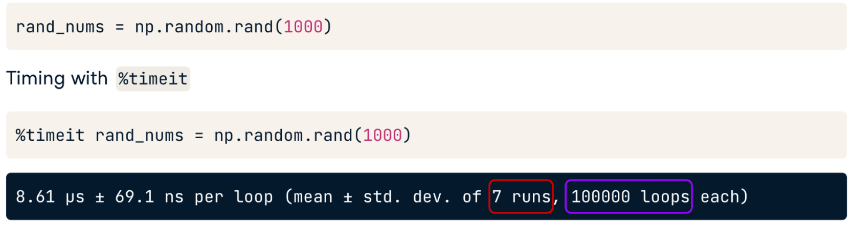

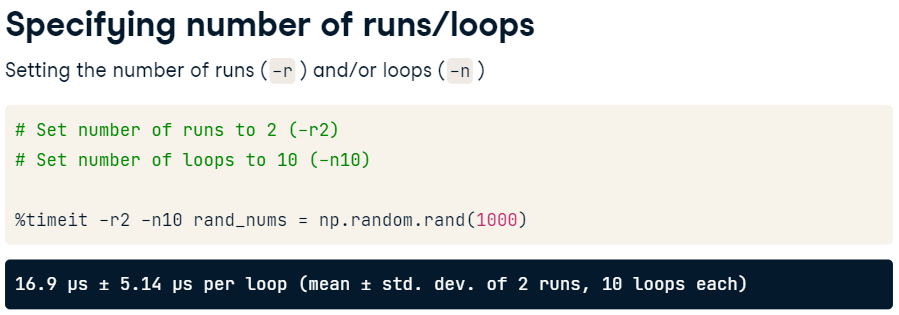
The number of runs represents how many iterations you'd like to use to estimate the runtime. <br>
The number of loops represents how many times you'd like the code to be executed per run. 

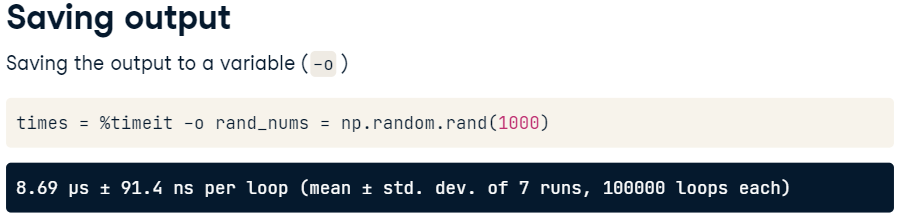

In [29]:
times = %timeit -o rand_nums = np.random.rand(1000)

9.88 µs ± 1.66 µs per loop (mean ± std. dev. of 7 runs, 10000 loops each)


In [30]:
# the time for each run
times.timings

[1.3238479998835828e-05,
 1.0977109998930246e-05,
 9.847129999252502e-06,
 1.0024159999738913e-05,
 8.393989999603945e-06,
 8.486669999547302e-06,
 8.223650000581983e-06]

In [32]:
# the best time for all runs
times.best

8.223650000581983e-06

In [33]:
# the worst time for all runs
times.worst

1.3238479998835828e-05

### Comparing times

In [35]:
# Create a list of integers (0-50) using list comprehension
%timeit nums_list_comp = [num for num in range(51)]
#print(nums_list_comp)

# Create a list of integers (0-50) by unpacking range
%timeit nums_unpack = [list(nums_list_comp)]
#print(nums_unpack)

2.28 µs ± 225 ns per loop (mean ± std. dev. of 7 runs, 100000 loops each)
355 ns ± 26.2 ns per loop (mean ± std. dev. of 7 runs, 1000000 loops each)


### Using %timeit: formal name or literal syntax
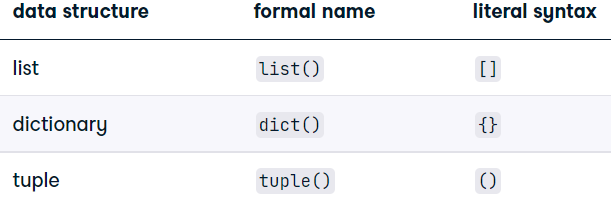

In [36]:
# Create a list using the formal name
formal_list = list()
print(formal_list)

# Create a list using the literal syntax
literal_list = []
print(literal_list)

# Print out the type of formal_list
print(type(formal_list))

# Print out the type of literal_list
print(type(literal_list))

[]
[]
<class 'list'>
<class 'list'>


In [43]:
f_time = %timeit -o formal_list = list()

l_time = %timeit -o literal_list = []

diff = (f_time.average - l_time.average) * (10**9)
print('l_time better than f_time by {} ns'.format(diff))

82.8 ns ± 16.6 ns per loop (mean ± std. dev. of 7 runs, 10000000 loops each)
33.2 ns ± 9.33 ns per loop (mean ± std. dev. of 7 runs, 10000000 loops each)
l_time better than f_time by 49.66417999988023 ns


### Using cell magic mode (%%timeit)
use `%timeit` to gather runtime for a single line of code (_line magic mode_) and `%%timeit` to get the runtime for multiple lines of code.

In [ ]:
wts = [35,45,55,56,78]

In [59]:
%%timeit 

hero_wts_lbs = []
for wt in wts:
    hero_wts_lbs.append(wt * 2.20462)

600 ns ± 13.8 ns per loop (mean ± std. dev. of 7 runs, 1000000 loops each)


In [58]:
%%timeit
wts_np = np.array(wts)
hero_wts_lbs_np = wts_np * 2.20462

2.71 µs ± 480 ns per loop (mean ± std. dev. of 7 runs, 100000 loops each)


## Code profiling for runtime
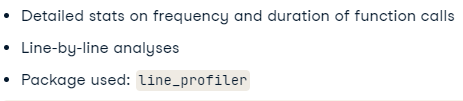

In [60]:
pip install line_profiler


     ---------------------------------------- 83.6/83.6 kB 2.3 MB/s eta 0:00:00


In [74]:
heroes = ['A-Bomb', 'Abe Sapien', 'Abin Sur', 'Abomination', 'Absorbing Man', 'Adam Strange',
          'Agent 13', 'Agent Bob', 'Agent Zero', 'Air-Walker', 'Ajax', 'Alan Scott']
hts = [203,  191,  185,  203,  193,  185,  173,  178,  191,  188,  193,  180 ]
wts = [441,  65,  90, 441, 122,  88,  61,  81, 104, 108,  90,  90]

In [75]:
def convert_units(heroes, heights, weights):

    new_hts = [ht * 0.39370  for ht in heights]
    new_wts = [wt * 2.20462  for wt in weights]

    hero_data = {}

    for i,hero in enumerate(heroes):
        hero_data[hero] = (new_hts[i], new_wts[i])

    return hero_data

In [76]:
%load_ext line_profiler

The line_profiler extension is already loaded. To reload it, use:
  %reload_ext line_profiler


*** `%lprun` uses a special syntax. First, we use the `-f` flag to indicate we'd like to profile a function. Next, we specify the name of the function we'd like to profile. ***

In [77]:
%lprun -f convert_units convert_units(heroes, hts, wts)

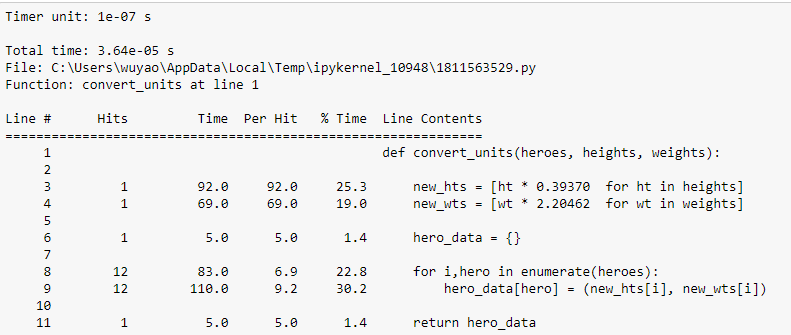

The output from %lprun provides a nice table that summarizes the profiling statistics.
* First, a column specifying the line number followed by a column displaying the number of times that line was executed (called the Hits column).
* Next, the Time column shows the total amount of time each line took to execute.
* This column uses a specific timer unit that can be found in the first line of the output. Here, the timer unit is listed in microseconds using scientific notation. `Timer unit: 1e-07 s`.We see that line three took 92 timer units, or, roughly 92 microseconds to run.
* The Per Hit column gives the average amount of time spent executing a single line. This is calculated by dividing the Time column by the Hits column. Notice that line 3 was executed 92 times and had a total run time of 92 microseconds, one microsecond per hit.
* The % Time column shows the percentage of time spent on a line relative to the total amount of time spent in the function. This can be a nice way to see which lines of code are taking up the most time within a function.
* Finally, the source code is displayed for each line in the Line Contents column.

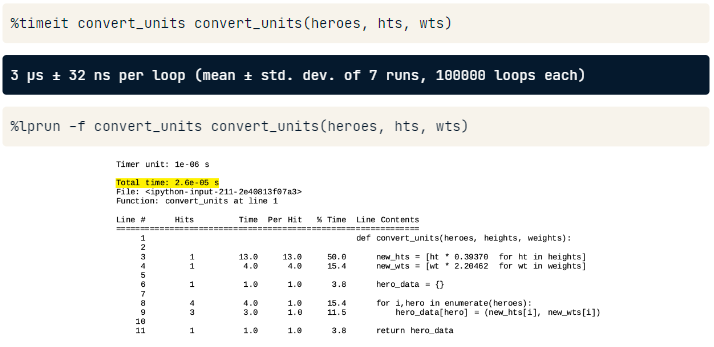
You may notice that the Total time reported when using %lprun and the time reported from using %timeit do not match. Remember, %timeit uses multiple loops in order to calculate an average and standard deviation of time, so the time reported from each of these magic commands aren't expected to match exactly.

## Code profiling for memory usage

### Quick and dirty usage
give us the size of an individual object

In [78]:
import sys

In [79]:
nums_list = [*range(1000)]
sys.getsizeof(nums_list)

8056

In [80]:
import numpy as np

In [81]:
nums_np = [*range(1000)]
sys.getsizeof(nums_np)

8056

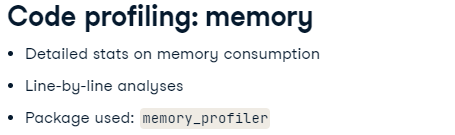

In [82]:
pip install memory_profiler

Note: you may need to restart the kernel to use updated packages.


In [83]:
%load_ext memory_profiler

In [84]:
%mprun -f convert_units convert_units(heroes, hts, wts)

ERROR: Could not find file C:\Users\wuyao\AppData\Local\Temp\ipykernel_10948\1811563529.py



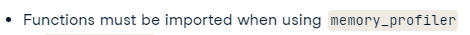
One drawback to using `%mprun` is that any function profiled for memory consumption must be defined in a file and imported. `%mprun` can only be used on functions defined in physical files, and not in the IPython session.

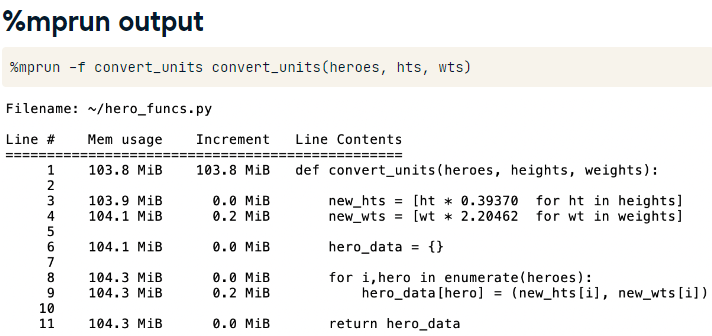
* The first column represents the line number of the code that has been profiled.
* The second column (Mem usage) is the memory used after that line has been executed.
* Next, the Increment column shows the difference in memory of the current line with respect to the previous one. This shows us the impact of the current line on the total memory usage.
* The last column (Line Contents) shows the source code that has been profiled.<br><br>
***Profiling a function with %mprun allows us to see what lines are taking up a large amount of memory and possibly develop a more efficient solution.***

# Gaining efficiencies
## Efficiently combining, counting, and iterating
### Combining objects

In [90]:
names = ['Bukbasaur', 'Charmander', 'Squiretle']
hps = [45, 39, 44]

In [91]:
combined_zip = zip(names, hps)
print(type(combined_zip))

<class 'zip'>


In [92]:
combined_zip_list = [*combined_zip]
print(combined_zip_list)

[('Bukbasaur', 45), ('Charmander', 39), ('Squiretle', 44)]


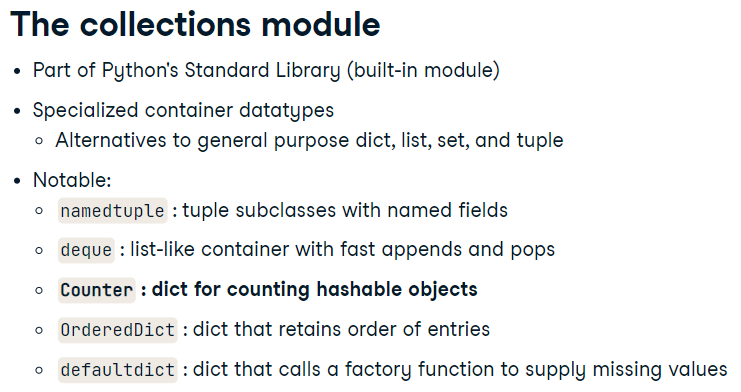

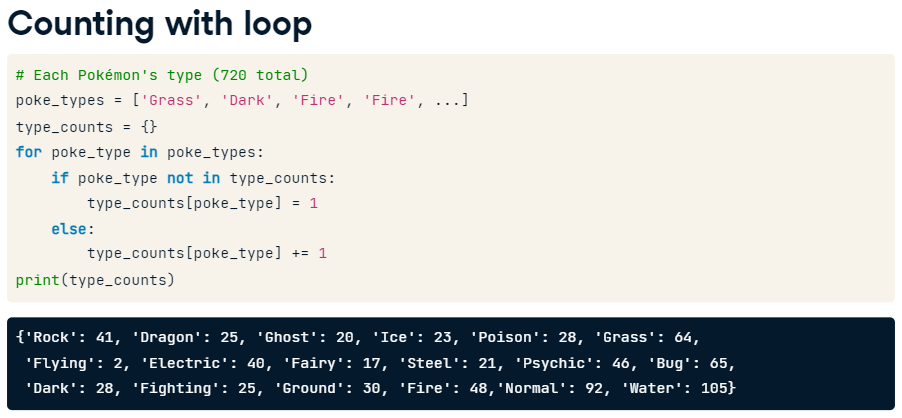

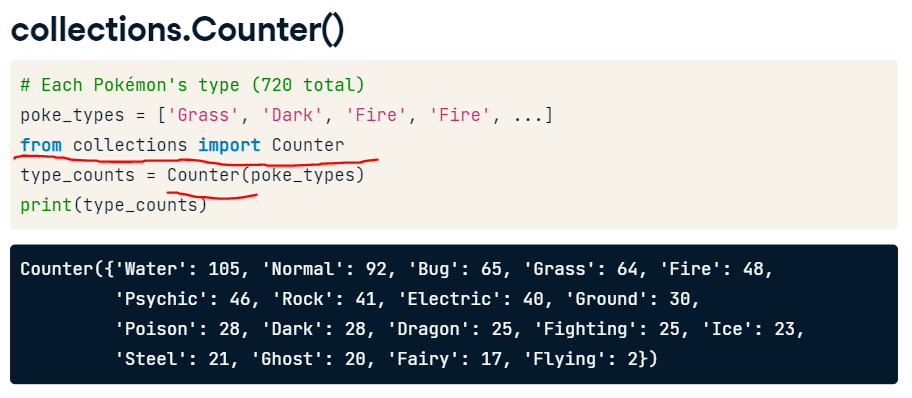

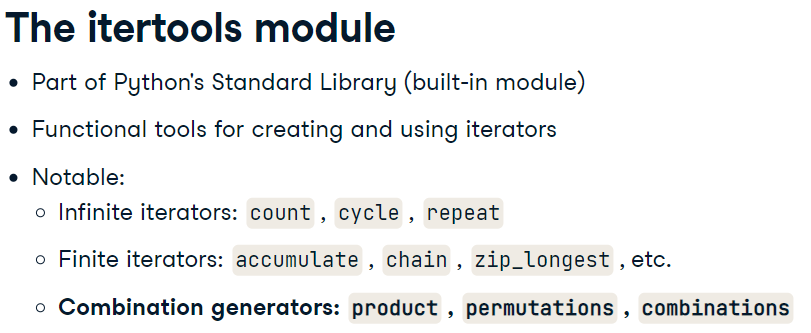

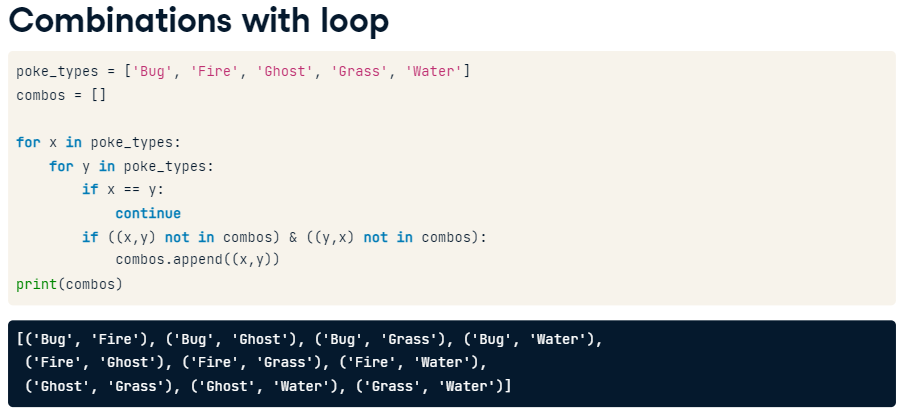

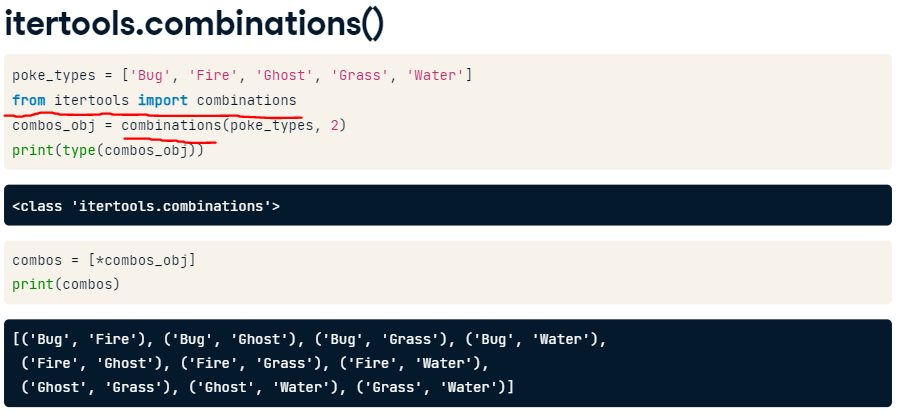

### Combining Pokémon names and types

In [102]:
names = ['Abomasnow', 'Abra', 'Absol', 'Accelgor', 'Aerodactyl']

primary_types = ['Grass', 'Psychic', 'Dark', 'Bug', 'Rock']

secondary_types =['Ice', '', '', '', 'Flying']

In [107]:
# Combine names and primary_types
names_type1 = [*zip(names, primary_types)]

print(*names_type1)

('Abomasnow', 'Grass') ('Abra', 'Psychic') ('Absol', 'Dark') ('Accelgor', 'Bug') ('Aerodactyl', 'Rock')


In [104]:
print(*names_type1[:5], sep='\n')

('Abomasnow', 'Grass')
('Abra', 'Psychic')
('Absol', 'Dark')
('Accelgor', 'Bug')
('Aerodactyl', 'Rock')


In [99]:
# Combine all three lists together
names_types = [*zip(names, primary_types, secondary_types)]

print(*names_types[:5], sep='\n')

('Abomasnow', 'Grass', 'Ice') ('Abra', 'Psychic', '') ('Absol', 'Dark', '') ('Accelgor', 'Bug', '') ('Aerodactyl', 'Rock', 'Flying')
('Abomasnow', 'Grass', 'Ice')
('Abra', 'Psychic', '')
('Absol', 'Dark', '')
('Accelgor', 'Bug', '')
('Aerodactyl', 'Rock', 'Flying')


In [108]:
# Combine five items from names and three items from primary_types
differing_lengths = [*zip(names[:5], primary_types[:3])]

print(*differing_lengths, sep='\n')

('Abomasnow', 'Grass')
('Abra', 'Psychic')
('Absol', 'Dark')


### Counting Pokémon from a sample

In [109]:
generations = [1, 1, 1, 5, 3, 5, 1, 6, 1, 6, 5, 5, 4, 6, 3, 4, 2, 5, 2, 5, 4, 1, 1, 2, 6, 5, 5, 6, 6, 1, 4, 5, 6, 2, 6, 1, 3, 2, 4, 1, 5, 3, 5, 5, 1, 5, 5, 5, 5, 6, 1, 3, 4, 6, 1, 4, 5, 3, 5, 5, 1, 4, 1, 1, 5, 6, 5, 1, 1, 6, 5, 5, 4, 6, 1, 1, 4, 5, 4, 5, 6, 2, 3, 5, 6, 5, 3, 4, 5, 1, 5, 6, 1, 1, 2, 3, 3, 3, 4, 4, 1, 3, 6, 3, 5, 3, 5, 3, 3, 1, 3, 6, 4, 4, 4, 5, 3, 4, 4, 3, 5, 5, 3, 5, 4, 1, 1, 3, 5, 3, 2, 5, 4, 3, 2, 4, 3, 5, 3, 1, 2, 4, 3, 5, 3, 5, 4, 1, 2, 4, 3, 5, 5, 1, 4, 6, 3, 6, 3, 4, 1, 5, 6, 1, 5, 4, 4, 3, 3, 5, 2, 3, 1, 6, 5, 1, 5, 4, 3, 6, 1, 3, 3, 6, 4, 3, 5, 4, 2, 4, 4, 1, 2, 5, 1, 3, 6, 4, 1, 1, 1, 1, 2, 4, 1, 1, 4, 4, 5, 3, 1, 4, 5, 3, 4, 1, 3, 4, 2, 5, 3, 4, 1, 1, 1, 5, 1, 4, 4, 3, 4, 3, 5, 3, 2, 3, 3, 3, 2, 4, 1, 3, 4, 2, 6, 5, 2, 5, 5, 1, 1, 1, 5, 4, 2, 4, 2, 2, 5, 5, 5, 4, 2, 3, 3, 5, 4, 5, 6, 3, 1, 2, 4, 2, 5, 1, 4, 3, 1, 1, 1, 1, 3, 5, 1, 3, 3, 3, 3, 5, 2, 5, 4, 2, 2, 3, 6, 4, 2, 1, 2, 5, 5, 3, 1, 3, 5, 5, 5, 5, 6, 5, 1, 5, 1, 5, 5, 1, 6, 4, 3, 1, 6, 5, 1, 4, 6, 5, 1, 2, 5, 5, 3, 1, 5, 5, 3, 3, 3, 6, 1, 5, 1, 3, 3, 4, 5, 3, 1, 1, 1, 6, 3, 3, 4, 5, 3, 5, 4, 5, 1, 5, 5, 3, 5, 6, 5, 4, 5, 6, 1, 1, 4, 1, 3, 4, 1, 4, 1, 1, 5, 4, 4, 5, 5, 6, 1, 1, 2, 4, 2, 5, 2, 5, 5, 6, 1, 3, 3, 5, 6, 4, 3, 3, 1, 5, 5, 2, 3, 5, 3, 6, 3, 5, 2, 1, 2, 5, 2, 3, 3, 1, 3, 1, 1, 4, 3, 1, 3, 5, 1, 3, 6, 4, 5, 2, 2, 6, 2, 2, 5, 6, 2, 1, 3, 5, 3, 3, 5, 5, 5, 3, 5, 2, 2, 4, 4, 3, 5, 6, 1, 4, 1, 1, 4, 2, 3, 4, 5, 2, 4, 3, 3, 4, 3, 3, 3, 3, 1, 2, 3, 5, 5, 6, 4, 3, 5, 5, 5, 6, 1, 2, 3, 1, 5, 6, 2, 1, 3, 5]

In [113]:
from collections import Counter

In [115]:
# Collect the count of primary types
type_count = Counter(primary_types)
print(type_count, '\n')

# Collect the count of generations
gen_count = Counter(generations)
print(gen_count, '\n')

Counter({'Grass': 1, 'Psychic': 1, 'Dark': 1, 'Bug': 1, 'Rock': 1}) 

Counter({5: 122, 3: 103, 1: 99, 4: 78, 2: 51, 6: 47}) 



In [117]:
# Use list comprehension to get each Pokémon's starting letter
starting_letters = [name[0] for name in names]

# Collect the count of Pokémon for each starting_letter
starting_letters_count = Counter(starting_letters)
print(starting_letters_count)

Counter({'A': 5})


### Combinations of Pokémon

In [118]:
pokemon = ['Geodude', 'Cubone', 'Lickitung', 'Persian', 'Diglett']

In [119]:
# Import combinations from itertools
from itertools import combinations

# Create a combination object with pairs of Pokémon
combos_obj = combinations(pokemon, 2)
print(type(combos_obj), '\n')

# Convert combos_obj to a list by unpacking
combos_2 = [*combos_obj]
print(combos_2, '\n')

# Collect all possible combinations of 4 Pokémon directly into a list
combos_4 = [*combinations(pokemon, 4)]
print(combos_4)

<class 'itertools.combinations'> 

[('Geodude', 'Cubone'), ('Geodude', 'Lickitung'), ('Geodude', 'Persian'), ('Geodude', 'Diglett'), ('Cubone', 'Lickitung'), ('Cubone', 'Persian'), ('Cubone', 'Diglett'), ('Lickitung', 'Persian'), ('Lickitung', 'Diglett'), ('Persian', 'Diglett')] 

[('Geodude', 'Cubone', 'Lickitung', 'Persian'), ('Geodude', 'Cubone', 'Lickitung', 'Diglett'), ('Geodude', 'Cubone', 'Persian', 'Diglett'), ('Geodude', 'Lickitung', 'Persian', 'Diglett'), ('Cubone', 'Lickitung', 'Persian', 'Diglett')]


## Set theory
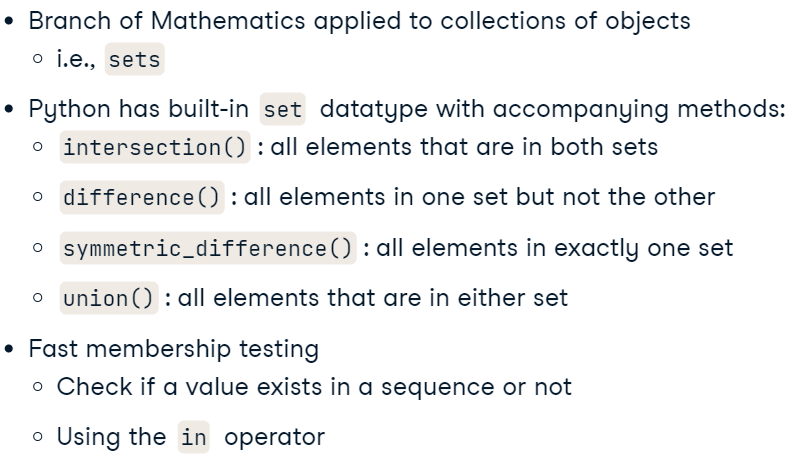

### Comparing Pokédexes

In [122]:
ash_pokedex = ['Pikachu', 'Bulbasaur', 'Koffing', 'Spearow', 'Vulpix', 'Wigglytuff', 'Zubat', 'Rattata', 'Psyduck', 'Squirtle'] 

misty_pokedex = ['Krabby', 'Horsea', 'Slowbro', 'Tentacool', 'Vaporeon', 'Magikarp', 'Poliwag', 'Starmie', 'Psyduck', 'Squirtle']

In [125]:
# Convert both lists to sets
ash_set = set(ash_pokedex)
misty_set = set(misty_pokedex)

# Find the Pokémon that exist in both sets
both = ash_set.intersection(misty_set)
print(both)

# Find the Pokémon that Ash has and Misty does not have
ash_only = ash_set.difference(misty_set)
print(ash_only)

# Find the Pokémon that Misty has and Ashdoes not have
misty_only = misty_set.difference(ash_set)
print(misty_only)

{'Squirtle', 'Psyduck'}
{'Vulpix', 'Zubat', 'Pikachu', 'Spearow', 'Wigglytuff', 'Koffing', 'Bulbasaur', 'Rattata'}
{'Vaporeon', 'Tentacool', 'Slowbro', 'Starmie', 'Poliwag', 'Horsea', 'Krabby', 'Magikarp'}


In [126]:
# Find the Pokémon that are in only one set (not both)
unique_to_set = ash_set.symmetric_difference(misty_set)
print(unique_to_set)

{'Vaporeon', 'Tentacool', 'Vulpix', 'Slowbro', 'Zubat', 'Spearow', 'Pikachu', 'Starmie', 'Poliwag', 'Horsea', 'Wigglytuff', 'Koffing', 'Krabby', 'Bulbasaur', 'Rattata', 'Magikarp'}


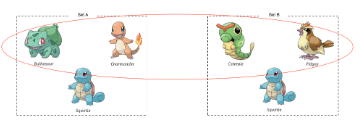

In [133]:
# Find the Pokémon that are in either or both sets
union_to_sets = ash_set.union(misty_set)
print(union_to_sets)

{'Vulpix', 'Zubat', 'Slowbro', 'Wigglytuff', 'Poliwag', 'Koffing', 'Krabby', 'Rattata', 'Vaporeon', 'Tentacool', 'Spearow', 'Pikachu', 'Starmie', 'Horsea', 'Bulbasaur', 'Psyduck', 'Squirtle', 'Magikarp'}


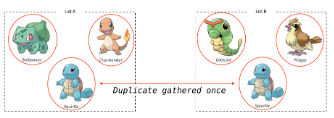

### Searching for Pokémon
check if certain Pokémon are members of either Ash or Brock's Pokédex.

In [127]:
brock_pokedex = ['Vulpix', 'Machop', 'Geodude', 'Omastar', 'Tauros', 'Onix', 'Dugtrio', 'Kabutops', 'Golem', 'Zubat']

In [128]:
# Convert Brock's Pokédex to a set
brock_pokedex_set = set(brock_pokedex)
print(brock_pokedex_set)

# Check if Psyduck is in Ash's list and Brock's set
print('Psyduck' in ash_pokedex)
print('Psyduck' in brock_pokedex_set)

{'Vulpix', 'Dugtrio', 'Kabutops', 'Zubat', 'Geodude', 'Golem', 'Machop', 'Tauros', 'Omastar', 'Onix'}
True
False


In [129]:
# Check if Machop is in Ash's list and Brock's set
print('Machop' in ash_pokedex)
print('Machop' in brock_pokedex_set)

False
True


When comparing runtimes, it's clear that membership testing with a set is significantly faster than a list or a tuple

In [132]:
%timeit 'Psyduck' in ash_pokedex
%timeit 'Psyduck' in ash_set

169 ns ± 24.9 ns per loop (mean ± std. dev. of 7 runs, 10000000 loops each)
54.7 ns ± 8 ns per loop (mean ± std. dev. of 7 runs, 10000000 loops each)


### Gathering unique Pokémon

In [134]:
names = ['Forretress', 'WormadamSandy Cloak', 'Croagunk', 'Mime Jr.', 'Camerupt', 'Alomomola', 'Munchlax', 'Tauros', 'Victini', 'Salamence', 'Flygon', 'Cottonee', 'Pachirisu', 'Caterpie', 'Avalugg', 'Beldum', 'Foongus', 'Zigzagoon', 'Buizel', 'Octillery', 'Seviper', 'Charmeleon', 'Torkoal', 'Doublade', 'Grovyle', 'Maractus', 'Tynamo', 'Magikarp', 'Beautifly', 'Parasect', 'Frogadier', 'Clefairy', 'Doduo', 'Aggron', 'Conkeldurr', 'Volbeat', 'Whimsicott', 'Sentret', 'Lairon', 'Jirachi', 'Cloyster', 'Dragalge', 'Hitmonlee', 'Gothitelle', 'Delphox', 'Magmortar', 'Talonflame', 'Victini', 'Feebas', 'Rampardos', 'Marowak', 'Pelipper', 'Espurr', 'MeowsticMale', 'Stunfisk', 'Cascoon', 'Metang', 'Scizor', 'Chimecho', 'Anorith', 'Heatmor', 'Shieldon', 'Doduo', 'Mesprit', 'Nidoran♀', 'Wartortle', 'Wooper', 'Mr. Mime', 'Mightyena', 'Mankey', 'Golbat', 'Azurill', 'Bagon', 'Leafeon', 'Electivire', 'Milotic', 'Elekid', 'Chimecho', 'Delphox', 'Gabite', 'Scizor', 'Budew', 'Haxorus', 'Porygon-Z', 'Beldum', 'Torterra', 'Volcanion', 'Chimecho', 'Pidove', 'Entei', 'WormadamPlant Cloak', 'Azelf', 'Galvantula', 'Tirtouga', 'Gible', 'Primeape', 'Zweilous', 'Shellder', 'Ho-oh', 'Emboar', 'Rotom', 'Solosis', 'Vigoroth', 'Frogadier', 'Ampharos', 'Gastly', 'Riolu', 'Doublade', 'Kirlia', 'Lickitung', 'Aromatisse', 'Mandibuzz', 'Happiny', 'Chandelure', 'Gorebyss', 'Barboach', 'Eevee', 'Ho-oh', 'Duosion', 'Sewaddle', 'Hippopotas', 'Seaking', 'Butterfree', 'Mew', 'Bronzor', 'Suicune', 'Herdier', 'Xerneas', 'Mareep', 'Slakoth', 'Uxie', 'Samurott', 'Dewgong', 'Togekiss', 'Pichu', 'Vanillish', 'Zapdos', 'Floette', 'Fletchling', 'Vigoroth', 'Umbreon', 'Conkeldurr', 'Phantump', 'Shellder', 'WormadamTrash Cloak', 'Rampardos', 'Electabuzz', 'Clawitzer', 'Dedenne', 'Regigigas', 'Xatu', 'Wartortle', 'Growlithe', 'Gulpin', 'Weezing', 'Starly', 'Scraggy', 'Skrelp', 'Wynaut', 'Carvanha', 'Solrock', 'Heatmor', 'KyogrePrimal Kyogre', 'Swinub', 'Mothim', 'Eelektrik', 'Yanma', 'Piplup', 'Chespin', 'Shellos', 'Cradily', 'Chatot', 'Burmy', 'Groudon', 'Inkay', 'Azumarill', 'Spinarak', 'Surskit', 'Azelf', 'Chandelure', 'Ariados', 'Gloom', 'Toxicroak', 'Teddiursa', 'Forretress', 'Onix', 'Musharna', 'Carbink', 'Phantump', 'Ledyba', 'Escavalier', 'Misdreavus', 'Nuzleaf', 'Drilbur', 'Staravia', 'Garbodor', 'Slakoth', 'Glalie', 'Minccino', 'Cottonee', 'Feraligatr', 'Munna', 'Ditto', 'Feraligatr', 'Igglybuff', 'Electrike', 'Tropius', 'Muk', 'Froslass', 'Huntail', 'Pidove', 'Shellder', 'Regice', 'Sealeo', 'Chinchou', 'Absol', 'Skrelp', 'Volcarona', 'Minun', 'Magnezone', 'Feraligatr', 'Marowak', 'Mantine', 'Shelmet', 'Abra', 'Musharna', 'Chespin', 'Victreebel', 'Sudowoodo', 'Grotle', 'Hawlucha', 'Ivysaur', 'Mew', 'Hawlucha', 'Porygon', 'Qwilfish', 'Skrelp', 'Natu', 'Clefable', 'Anorith', 'RotomWash Rotom', 'Swoobat', 'Floette', 'Corsola', 'Marowak', 'Glalie', 'Buneary', 'Zweilous', 'Arceus', 'Ponyta', 'Sandslash', 'Dugtrio', 'Kingler', 'Breloom', 'Lilligant', 'Entei', 'Carbink', 'Audino', 'Dewott', 'Golem', 'Victreebel', 'Shiftry', 'Swirlix', 'Caterpie', 'Krabby', 'Nosepass', 'Roggenrola', 'Gligar', 'Sceptile', 'Sunflora', 'Leavanny', 'Froakie', 'Girafarig', 'Exeggcute', 'Simipour', 'Archeops', 'Kadabra', 'Chikorita', 'Chansey', 'Onix', 'Cottonee', 'Muk', 'Chimecho', 'Victini', 'Gastrodon', 'Cradily', 'Exeggcute', 'Celebi', 'Eelektross', 'Sliggoo', 'Haunter', 'Bouffalant', 'Crobat', 'Solrock', 'Whismur', 'Sudowoodo', 'Durant', 'Articuno', 'Minun', 'Rhyperior', 'Ho-oh', 'Electrode', 'Lombre', 'Mesprit', 'Goodra', 'Numel', 'Castform', 'Drifblim', 'Bastiodon', 'Helioptile', 'Aggron', 'Scolipede', 'Sandslash', 'Cherrim', 'Mantyke', 'Golduck', 'Wingull', 'Froslass', 'Seismitoad', 'Manaphy', 'Jynx', 'Gallade', 'Karrablast', 'Rampardos', 'Haxorus', 'Sandshrew', 'Bayleef', 'Ludicolo', 'Blitzle', 'Venonat', 'Chingling', 'Flygon', 'Raticate', 'Espeon', 'Lileep', 'Durant', 'Surskit', 'Wynaut', 'Slowking', 'Abomasnow', 'Larvesta', 'Registeel', 'Hoppip', 'Drilbur', 'Aggron', 'Murkrow', 'Fennekin', 'Archen', 'Klink', 'Pignite', 'Golduck', 'Sableye', 'Wartortle', 'Sliggoo', 'Trapinch', 'Vanilluxe', 'Gengar', 'Carracosta', 'Espurr', 'Golett', 'Tropius', 'Weepinbell', 'Krabby', 'Talonflame', 'Hippopotas', 'Simisear', 'Slowbro', 'Manectric', 'Lugia', 'Gligar', 'Claydol', 'Tangela', 'Duskull', 'Buneary', 'Altaria', 'Cryogonal', 'Elekid', 'Toxicroak', 'Zapdos', 'Ralts', 'KyogrePrimal Kyogre', "Farfetch'd", 'Duskull', 'Mesprit', 'Mightyena', 'Manaphy', 'Zebstrika', 'Vileplume', 'Smeargle', 'Ludicolo', 'Numel', 'Snover', 'Totodile', 'Reuniclus', 'Panpour', 'Pyroar', 'Qwilfish', 'Manaphy', 'Tyranitar', 'Kyurem', 'Honchkrow', 'Tympole', 'Azurill', 'Pikachu', 'Forretress', 'Marshtomp', 'Persian', 'Gigalith', 'Clamperl', 'Poliwag', 'Reuniclus', 'Kricketot', 'Exeggcute', 'Infernape', 'Chingling', 'Gulpin', 'Yveltal', 'Porygon-Z', 'Cascoon', 'Donphan', 'Duosion', 'Natu', 'Lombre', 'Phantump', 'Spheal', 'Corsola', 'Bastiodon', 'Spritzee', 'Nincada', 'Beheeyem', 'Quagsire', 'Combusken', 'Vespiquen', 'DarmanitanStandard Mode', 'Scizor', 'Swanna', 'Pidgeotto', 'Cradily', 'Blissey', 'Clefable', 'Numel', 'Virizion', 'Chesnaught', 'Yamask', 'Burmy', 'Butterfree', 'Garchomp', 'Masquerain', 'Ursaring', 'Servine', 'Infernape', 'Ludicolo', 'Gastrodon', 'Ducklett', 'Bergmite', 'Espurr', 'Moltres', 'Butterfree', 'Arcanine', 'Chansey', 'Chespin', 'Snover', 'Shroomish', 'Mightyena', 'Swoobat', 'Grumpig', 'Bellsprout', 'Cyndaquil', 'Gabite', 'Bibarel', 'Zorua', 'WormadamPlant Cloak', 'Roggenrola', 'Arcanine', 'Slakoth', 'Dewott', 'Scizor', 'Crawdaunt', 'Fearow', 'Buizel', 'Tentacruel', 'Azumarill', 'Espeon', 'Watchog', 'Staravia', 'Amaura', 'Exeggutor', 'Gible', 'Marowak', 'Ekans', 'Bastiodon', 'Shelgon', 'Roserade', 'Scrafty', 'Machamp', 'Shuppet', 'Mawile', 'Boldore', 'Krookodile', 'Sudowoodo']

primary_types = ['Bug', 'Bug', 'Poison', 'Psychic', 'Fire', 'Water', 'Normal', 'Normal', 'Psychic', 'Dragon', 'Ground', 'Grass', 'Electric', 'Bug', 'Ice', 'Steel', 'Grass', 'Normal', 'Water', 'Water', 'Poison', 'Fire', 'Fire', 'Steel', 'Grass', 'Grass', 'Electric', 'Water', 'Bug', 'Bug', 'Water', 'Fairy', 'Normal', 'Steel', 'Fighting', 'Bug', 'Grass', 'Normal', 'Steel', 'Steel', 'Water', 'Poison', 'Fighting', 'Psychic', 'Fire', 'Fire', 'Fire', 'Psychic', 'Water', 'Rock', 'Ground', 'Water', 'Psychic', 'Psychic', 'Ground', 'Bug', 'Steel', 'Bug', 'Psychic', 'Rock', 'Fire', 'Rock', 'Normal', 'Psychic', 'Poison', 'Water', 'Water', 'Psychic', 'Dark', 'Fighting', 'Poison', 'Normal', 'Dragon', 'Grass', 'Electric', 'Water', 'Electric', 'Psychic', 'Fire', 'Dragon', 'Bug', 'Grass', 'Dragon', 'Normal', 'Steel', 'Grass', 'Fire', 'Psychic', 'Normal', 'Fire', 'Bug', 'Psychic', 'Bug', 'Water', 'Dragon', 'Fighting', 'Dark', 'Water', 'Fire', 'Fire', 'Electric', 'Psychic', 'Normal', 'Water', 'Electric', 'Ghost', 'Fighting', 'Steel', 'Psychic', 'Normal', 'Fairy', 'Dark', 'Normal', 'Ghost', 'Water', 'Water', 'Normal', 'Fire', 'Psychic', 'Bug', 'Ground', 'Water', 'Bug', 'Psychic', 'Steel', 'Water', 'Normal', 'Fairy', 'Electric', 'Normal', 'Psychic', 'Water', 'Water', 'Fairy', 'Electric', 'Ice', 'Electric', 'Fairy', 'Normal', 'Normal', 'Dark', 'Fighting', 'Ghost', 'Water', 'Bug', 'Rock', 'Electric', 'Water', 'Electric', 'Normal', 'Psychic', 'Water', 'Fire', 'Poison', 'Poison', 'Normal', 'Dark', 'Poison', 'Psychic', 'Water', 'Rock', 'Fire', 'Water', 'Ice', 'Bug', 'Electric', 'Bug', 'Water', 'Grass', 'Water', 'Rock', 'Normal', 'Bug', 'Ground', 'Dark', 'Water', 'Bug', 'Bug', 'Psychic', 'Ghost', 'Bug', 'Grass', 'Poison', 'Normal', 'Bug', 'Rock', 'Psychic', 'Rock', 'Ghost', 'Bug', 'Bug', 'Ghost', 'Grass', 'Ground', 'Normal', 'Poison', 'Normal', 'Ice', 'Normal', 'Grass', 'Water', 'Psychic', 'Normal', 'Water', 'Normal', 'Electric', 'Grass', 'Poison', 'Ice', 'Water', 'Normal', 'Water', 'Ice', 'Ice', 'Water', 'Dark', 'Poison', 'Bug', 'Electric', 'Electric', 'Water', 'Ground', 'Water', 'Bug', 'Psychic', 'Psychic', 'Grass', 'Grass', 'Rock', 'Grass', 'Fighting', 'Grass', 'Psychic', 'Fighting', 'Normal', 'Water', 'Poison', 'Psychic', 'Fairy', 'Rock', 'Electric', 'Psychic', 'Fairy', 'Water', 'Ground', 'Ice', 'Normal', 'Dark', 'Normal', 'Fire', 'Ground', 'Ground', 'Water', 'Grass', 'Grass', 'Fire', 'Rock', 'Normal', 'Water', 'Rock', 'Grass', 'Grass', 'Fairy', 'Bug', 'Water', 'Rock', 'Rock', 'Ground', 'Grass', 'Grass', 'Bug', 'Water', 'Normal', 'Grass', 'Water', 'Rock', 'Psychic', 'Grass', 'Normal', 'Rock', 'Grass', 'Poison', 'Psychic', 'Psychic', 'Water', 'Rock', 'Grass', 'Psychic', 'Electric', 'Dragon', 'Ghost', 'Normal', 'Poison', 'Rock', 'Normal', 'Rock', 'Bug', 'Ice', 'Electric', 'Ground', 'Fire', 'Electric', 'Water', 'Psychic', 'Dragon', 'Fire', 'Normal', 'Ghost', 'Rock', 'Electric', 'Steel', 'Bug', 'Ground', 'Grass', 'Water', 'Water', 'Water', 'Ice', 'Water', 'Water', 'Ice', 'Psychic', 'Bug', 'Rock', 'Dragon', 'Ground', 'Grass', 'Water', 'Electric', 'Bug', 'Psychic', 'Ground', 'Normal', 'Psychic', 'Rock', 'Bug', 'Bug', 'Psychic', 'Water', 'Grass', 'Bug', 'Steel', 'Grass', 'Ground', 'Steel', 'Dark', 'Fire', 'Rock', 'Steel', 'Fire', 'Water', 'Dark', 'Water', 'Dragon', 'Ground', 'Ice', 'Ghost', 'Water', 'Psychic', 'Ground', 'Grass', 'Grass', 'Water', 'Fire', 'Ground', 'Fire', 'Water', 'Electric', 'Psychic', 'Ground', 'Ground', 'Grass', 'Ghost', 'Normal', 'Dragon', 'Ice', 'Electric', 'Poison', 'Electric', 'Psychic', 'Water', 'Normal', 'Ghost', 'Psychic', 'Dark', 'Water', 'Electric', 'Grass', 'Normal', 'Water', 'Fire', 'Grass', 'Water', 'Psychic', 'Water', 'Fire', 'Water', 'Water', 'Rock', 'Dragon', 'Dark', 'Water', 'Normal', 'Electric', 'Bug', 'Water', 'Normal', 'Rock', 'Water', 'Water', 'Psychic', 'Bug', 'Grass', 'Fire', 'Psychic', 'Poison', 'Dark', 'Normal', 'Bug', 'Ground', 'Psychic', 'Psychic', 'Water', 'Ghost', 'Ice', 'Water', 'Rock', 'Fairy', 'Bug', 'Psychic', 'Water', 'Fire', 'Bug', 'Fire', 'Bug', 'Water', 'Normal', 'Rock', 'Normal', 'Fairy', 'Fire', 'Grass', 'Grass', 'Ghost', 'Bug', 'Bug', 'Dragon', 'Bug', 'Normal', 'Grass', 'Fire', 'Water', 'Water', 'Water', 'Ice', 'Psychic', 'Fire', 'Bug', 'Fire', 'Normal', 'Grass', 'Grass', 'Grass', 'Dark', 'Psychic', 'Psychic', 'Grass', 'Fire', 'Dragon', 'Normal', 'Dark', 'Bug', 'Rock', 'Fire', 'Normal', 'Water', 'Bug', 'Water', 'Normal', 'Water', 'Water', 'Water', 'Psychic', 'Normal', 'Normal', 'Rock', 'Grass', 'Dragon', 'Ground', 'Poison', 'Rock', 'Dragon', 'Grass', 'Dark', 'Fighting', 'Ghost', 'Steel', 'Rock', 'Ground', 'Rock']

generations = [2, 4, 4, 4, 3, 5, 4, 1, 5, 3, 3, 5, 4, 1, 6, 3, 5, 3, 4, 2, 3, 1, 3, 6, 3, 5, 5, 1, 3, 1, 6, 1, 1, 3, 5, 3, 5, 2, 3, 3, 1, 6, 1, 5, 6, 4, 6, 5, 3, 4, 1, 3, 6, 6, 5, 3, 3, 2, 3, 3, 5, 4, 1, 4, 1, 1, 2, 1, 3, 1, 1, 3, 3, 4, 4, 3, 2, 3, 6, 4, 2, 4, 5, 4, 3, 4, 6, 3, 5, 2, 4, 4, 5, 5, 4, 1, 5, 1, 2, 5, 4, 5, 3, 6, 2, 1, 4, 6, 3, 1, 6, 5, 4, 5, 3, 3, 1, 2, 5, 5, 4, 1, 1, 1, 4, 2, 5, 6, 2, 3, 4, 5, 1, 4, 2, 5, 1, 6, 6, 3, 2, 5, 6, 1, 4, 4, 1, 6, 6, 4, 2, 1, 1, 3, 1, 4, 5, 6, 3, 3, 3, 5, 3, 2, 4, 5, 2, 4, 6, 4, 3, 4, 4, 3, 6, 2, 2, 3, 4, 5, 2, 1, 4, 2, 2, 1, 5, 6, 6, 2, 5, 2, 3, 5, 4, 5, 3, 3, 5, 5, 2, 5, 1, 2, 2, 3, 3, 1, 4, 3, 5, 1, 3, 3, 2, 3, 6, 5, 3, 4, 2, 1, 2, 5, 1, 5, 6, 1, 2, 4, 6, 1, 1, 6, 1, 2, 6, 2, 1, 3, 4, 5, 6, 2, 1, 3, 4, 5, 4, 1, 1, 1, 1, 3, 5, 2, 6, 5, 5, 1, 1, 3, 6, 1, 1, 3, 5, 2, 3, 2, 5, 6, 2, 1, 5, 5, 1, 2, 1, 1, 5, 1, 3, 5, 4, 3, 1, 2, 5, 6, 1, 5, 2, 3, 3, 2, 5, 1, 3, 4, 2, 1, 3, 4, 6, 3, 3, 4, 4, 6, 3, 5, 1, 4, 4, 1, 3, 4, 5, 4, 1, 4, 5, 4, 5, 1, 2, 3, 5, 1, 4, 3, 1, 2, 3, 5, 3, 3, 2, 4, 5, 3, 2, 5, 3, 2, 6, 5, 5, 5, 1, 3, 1, 6, 3, 5, 1, 5, 6, 5, 3, 1, 1, 6, 4, 5, 1, 3, 2, 2, 3, 1, 3, 4, 3, 5, 2, 4, 1, 3, 3, 1, 3, 4, 3, 4, 5, 1, 2, 3, 3, 4, 2, 5, 5, 6, 2, 4, 2, 5, 4, 5, 3, 1, 2, 3, 1, 5, 3, 1, 5, 4, 1, 4, 4, 3, 6, 4, 3, 2, 5, 2, 3, 6, 3, 2, 4, 6, 3, 5, 2, 3, 4, 5, 2, 5, 1, 3, 2, 1, 3, 5, 6, 5, 4, 1, 4, 3, 2, 5, 4, 3, 4, 5, 6, 6, 1, 1, 1, 1, 6, 4, 3, 3, 5, 3, 1, 2, 4, 4, 5, 4, 5, 1, 3, 5, 2, 3, 1, 4, 1, 2, 2, 5, 4, 6, 1, 4, 1, 1, 4, 3, 4, 5, 1, 3, 3, 5, 5, 2]

In [135]:
def find_unique_items(data):
    uniques = []

    for item in data:
        if item not in uniques:
            uniques.append(item)

    return uniques

In [136]:
# Use find_unique_items() to collect unique Pokémon names
uniq_names_func = find_unique_items(names)
print(len(uniq_names_func))

# Convert the names list to a set to collect unique Pokémon names
uniq_names_set = set(names)
print(len(uniq_names_set))

# Check that both unique collections are equivalent
print(sorted(uniq_names_func) == sorted(uniq_names_set))

368
368
True


In [139]:
%timeit 'Croagunk' in uniq_names_func
%timeit 'Croagunk' in uniq_names_set

70.6 ns ± 3.09 ns per loop (mean ± std. dev. of 7 runs, 10000000 loops each)
53.8 ns ± 3.74 ns per loop (mean ± std. dev. of 7 runs, 10000000 loops each)


Using a set to collect unique values is faster.

In [140]:
# Use the best approach to collect unique primary types and generations
uniq_types = set(primary_types) 
uniq_gens = set(generations)
print(uniq_types, uniq_gens, sep='\n') 

{'Poison', 'Dark', 'Dragon', 'Bug', 'Rock', 'Ice', 'Fairy', 'Ghost', 'Water', 'Fighting', 'Grass', 'Steel', 'Psychic', 'Normal', 'Ground', 'Electric', 'Fire'}
{1, 2, 3, 4, 5, 6}


## Eliminating loops
### Gathering Pokémon without a loop

In [142]:
poke_names = ['Abomasnow', 'Abra', 'Absol', 'Accelgor', 'Aerodactyl', 'Aggron', 'Aipom', 'Alakazam', 'Alomomola', 'Altaria', 'Amaura', 'Ambipom', 'Amoonguss', 'Ampharos', 'Anorith', 'Arbok', 'Arcanine', 'Arceus', 'Archen', 'Archeops', 'Ariados', 'Armaldo', 'Aromatisse', 'Aron', 'Articuno', 'Audino', 'Aurorus', 'Avalugg', 'Axew', 'Azelf', 'Azumarill', 'Azurill', 'Bagon', 'Baltoy', 'Banette', 'Barbaracle', 'Barboach', 'Basculin', 'Bastiodon', 'Bayleef', 'Beartic', 'Beautifly', 'Beedrill', 'Beheeyem', 'Beldum', 'Bellossom', 'Bellsprout', 'Bergmite', 'Bibarel', 'Bidoof', 'Binacle', 'Bisharp', 'Blastoise', 'Blaziken', 'Blissey', 'Blitzle', 'Boldore', 'Bonsly', 'Bouffalant', 'Braixen', 'Braviary', 'Breloom', 'Bronzong', 'Bronzor', 'Budew', 'Buizel', 'Bulbasaur', 'Buneary', 'Bunnelby', 'Burmy', 'Butterfree', 'Cacnea', 'Cacturne', 'Camerupt', 'Carbink', 'Carnivine', 'Carracosta', 'Carvanha', 'Cascoon', 'Castform', 'Caterpie', 'Celebi', 'Chandelure', 'Chansey', 'Charizard', 'Charmander', 'Charmeleon', 'Chatot', 'Cherrim', 'Cherubi', 'Chesnaught', 'Chespin', 'Chikorita', 'Chimchar', 'Chimecho', 'Chinchou', 'Chingling', 'Cinccino', 'Clamperl', 'Clauncher', 'Clawitzer', 'Claydol', 'Clefable', 'Clefairy', 'Cleffa', 'Cloyster', 'Cobalion', 'Cofagrigus', 'Combee', 'Combusken', 'Conkeldurr', 'Corphish', 'Corsola', 'Cottonee', 'Cradily', 'Cranidos', 'Crawdaunt', 'Cresselia', 'Croagunk', 'Crobat', 'Croconaw', 'Crustle', 'Cryogonal', 'Cubchoo', 'Cubone', 'Cyndaquil', 'Darkrai', 'DarmanitanStandard Mode', 'DarmanitanZen Mode', 'Darumaka', 'Dedenne', 'Deerling', 'Deino', 'Delcatty', 'Delibird', 'Delphox', 'Dewgong', 'Dewott', 'Dialga', 'Diancie', 'Diggersby', 'Diglett', 'Ditto', 'Dodrio', 'Doduo', 'Donphan', 'Doublade', 'Dragalge', 'Dragonair', 'Dragonite', 'Drapion', 'Dratini', 'Drifblim', 'Drifloon', 'Drilbur', 'Drowzee', 'Druddigon', 'Ducklett', 'Dugtrio', 'Dunsparce', 'Duosion', 'Durant', 'Dusclops', 'Dusknoir', 'Duskull', 'Dustox', 'Dwebble', 'Eelektrik', 'Eelektross', 'Eevee', 'Ekans', 'Electabuzz', 'Electivire', 'Electrike', 'Electrode', 'Elekid', 'Elgyem', 'Emboar', 'Emolga', 'Empoleon', 'Entei', 'Escavalier', 'Espeon', 'Espurr', 'Excadrill', 'Exeggcute', 'Exeggutor', 'Exploud', "Farfetch'd", 'Fearow', 'Feebas', 'Fennekin', 'Feraligatr', 'Ferroseed', 'Ferrothorn', 'Finneon', 'Flaaffy', 'Flabébé', 'Flareon', 'Fletchinder', 'Fletchling', 'Floatzel', 'Floette', 'Florges', 'Flygon', 'Foongus', 'Forretress', 'Fraxure', 'Frillish', 'Froakie', 'Frogadier', 'Froslass', 'Furfrou', 'Furret', 'Gabite', 'Gallade', 'Galvantula', 'Garbodor', 'Garchomp', 'Gardevoir', 'Gastly', 'Gastrodon', 'Genesect', 'Gengar', 'Geodude', 'Gible', 'Gigalith', 'Girafarig', 'Glaceon', 'Glalie', 'Glameow', 'Gligar', 'Gliscor', 'Gloom', 'Gogoat', 'Golbat', 'Goldeen', 'Golduck', 'Golem', 'Golett', 'Golurk', 'Goodra', 'Goomy', 'Gorebyss', 'Gothita', 'Gothitelle', 'Gothorita', 'Granbull', 'Graveler', 'Greninja', 'Grimer', 'Grotle', 'Groudon', 'GroudonPrimal Groudon', 'Grovyle', 'Growlithe', 'Grumpig', 'Gulpin', 'Gurdurr', 'Gyarados', 'Happiny', 'Hariyama', 'Haunter', 'Hawlucha', 'Haxorus', 'Heatmor', 'Heatran', 'Heliolisk', 'Helioptile', 'Heracross', 'Herdier', 'Hippopotas', 'Hippowdon', 'Hitmonchan', 'Hitmonlee', 'Hitmontop', 'Ho-oh', 'Honchkrow', 'Honedge', 'Hoothoot', 'Hoppip', 'Horsea', 'Houndoom', 'Houndour', 'Huntail', 'Hydreigon', 'Hypno', 'Igglybuff', 'Illumise', 'Infernape', 'Inkay', 'Ivysaur', 'Jellicent', 'Jigglypuff', 'Jirachi', 'Jolteon', 'Joltik', 'Jumpluff', 'Jynx', 'Kabuto', 'Kabutops', 'Kadabra', 'Kakuna', 'Kangaskhan', 'Karrablast', 'Kecleon', 'Kingdra', 'Kingler', 'Kirlia', 'Klang', 'Klefki', 'Klink', 'Klinklang', 'Koffing', 'Krabby', 'Kricketot', 'Kricketune', 'Krokorok', 'Krookodile', 'Kyogre', 'KyogrePrimal Kyogre', 'Kyurem', 'KyuremBlack Kyurem', 'KyuremWhite Kyurem', 'Lairon', 'Lampent', 'Lanturn', 'Lapras', 'Larvesta', 'Larvitar', 'Latias', 'Latios', 'Leafeon', 'Leavanny', 'Ledian', 'Ledyba', 'Lickilicky', 'Lickitung', 'Liepard', 'Lileep', 'Lilligant', 'Lillipup', 'Linoone', 'Litleo', 'Litwick', 'Lombre', 'Lopunny', 'Lotad', 'Loudred', 'Lucario', 'Ludicolo', 'Lugia', 'Lumineon', 'Lunatone', 'Luvdisc', 'Luxio', 'Luxray', 'Machamp', 'Machoke', 'Machop', 'Magby', 'Magcargo', 'Magikarp', 'Magmar', 'Magmortar', 'Magnemite', 'Magneton', 'Magnezone', 'Makuhita', 'Malamar', 'Mamoswine', 'Manaphy', 'Mandibuzz', 'Manectric', 'Mankey', 'Mantine', 'Mantyke', 'Maractus', 'Mareep', 'Marill', 'Marowak', 'Marshtomp', 'Masquerain', 'Mawile', 'Medicham', 'Meditite', 'MeowsticFemale', 'MeowsticMale', 'Meowth', 'Mesprit', 'Metagross', 'Metang', 'Metapod', 'Mew', 'Mewtwo', 'Mienfoo', 'Mienshao', 'Mightyena', 'Milotic', 'Miltank', 'Mime Jr.', 'Minccino', 'Minun', 'Misdreavus', 'Mismagius', 'Moltres', 'Monferno', 'Mothim', 'Mr. Mime', 'Mudkip', 'Muk', 'Munchlax', 'Munna', 'Murkrow', 'Musharna', 'Natu', 'Nidoking', 'Nidoqueen', 'Nidoran♀', 'Nidoran♂', 'Nidorina', 'Nidorino', 'Nincada', 'Ninetales', 'Ninjask', 'Noctowl', 'Noibat', 'Noivern', 'Nosepass', 'Numel', 'Nuzleaf', 'Octillery', 'Oddish', 'Omanyte', 'Omastar', 'Onix', 'Oshawott', 'Pachirisu', 'Palkia', 'Palpitoad', 'Pancham', 'Pangoro', 'Panpour', 'Pansage', 'Pansear', 'Paras', 'Parasect', 'Patrat', 'Pawniard', 'Pelipper', 'Persian', 'Petilil', 'Phanpy', 'Phantump', 'Phione', 'Pichu', 'Pidgeot', 'Pidgeotto', 'Pidgey', 'Pidove', 'Pignite', 'Pikachu', 'Piloswine', 'Pineco', 'Pinsir', 'Piplup', 'Plusle', 'Politoed', 'Poliwag', 'Poliwhirl', 'Poliwrath', 'Ponyta', 'Poochyena', 'Porygon', 'Porygon-Z', 'Porygon2', 'Primeape', 'Prinplup', 'Probopass', 'Psyduck', 'Pupitar', 'Purrloin', 'Purugly', 'Pyroar', 'Quagsire', 'Quilava', 'Quilladin', 'Qwilfish', 'Raichu', 'Raikou', 'Ralts', 'Rampardos', 'Rapidash', 'Raticate', 'Rattata', 'Rayquaza', 'Regice', 'Regigigas', 'Regirock', 'Registeel', 'Relicanth', 'Remoraid', 'Reshiram', 'Reuniclus', 'Rhydon', 'Rhyhorn', 'Rhyperior', 'Riolu', 'Roggenrola', 'Roselia', 'Roserade', 'Rotom', 'RotomFan Rotom', 'RotomFrost Rotom', 'RotomHeat Rotom', 'RotomMow Rotom', 'RotomWash Rotom', 'Rufflet', 'Sableye', 'Salamence', 'Samurott', 'Sandile', 'Sandshrew', 'Sandslash', 'Sawk', 'Sawsbuck', 'Scatterbug', 'Sceptile', 'Scizor', 'Scolipede', 'Scrafty', 'Scraggy', 'Scyther', 'Seadra', 'Seaking', 'Sealeo', 'Seedot', 'Seel', 'Seismitoad', 'Sentret', 'Serperior', 'Servine', 'Seviper', 'Sewaddle', 'Sharpedo', 'Shedinja', 'Shelgon', 'Shellder', 'Shellos', 'Shelmet', 'Shieldon', 'Shiftry', 'Shinx', 'Shroomish', 'Shuckle', 'Shuppet', 'Sigilyph', 'Silcoon', 'Simipour', 'Simisage', 'Simisear', 'Skarmory', 'Skiddo', 'Skiploom', 'Skitty', 'Skorupi', 'Skrelp', 'Skuntank', 'Slaking', 'Slakoth', 'Sliggoo', 'Slowbro', 'Slowking', 'Slowpoke', 'Slugma', 'Slurpuff', 'Smeargle', 'Smoochum', 'Sneasel', 'Snivy', 'Snorlax', 'Snorunt', 'Snover', 'Snubbull', 'Solosis', 'Solrock', 'Spearow', 'Spewpa', 'Spheal', 'Spinarak', 'Spinda', 'Spiritomb', 'Spoink', 'Spritzee', 'Squirtle', 'Stantler', 'Staraptor', 'Staravia', 'Starly', 'Starmie', 'Staryu', 'Steelix', 'Stoutland', 'Stunfisk', 'Stunky', 'Sudowoodo', 'Suicune', 'Sunflora', 'Sunkern', 'Surskit', 'Swablu', 'Swadloon', 'Swalot', 'Swampert', 'Swanna', 'Swellow', 'Swinub', 'Swirlix', 'Swoobat', 'Sylveon', 'Taillow', 'Talonflame', 'Tangela', 'Tangrowth', 'Tauros', 'Teddiursa', 'Tentacool', 'Tentacruel', 'Tepig', 'Terrakion', 'Throh', 'Timburr', 'Tirtouga', 'Togekiss', 'Togepi', 'Togetic', 'Torchic', 'Torkoal', 'Torterra', 'Totodile', 'Toxicroak', 'Tranquill', 'Trapinch', 'Treecko', 'Trevenant', 'Tropius', 'Trubbish', 'Turtwig', 'Tympole', 'Tynamo', 'Typhlosion', 'Tyranitar', 'Tyrantrum', 'Tyrogue', 'Tyrunt', 'Umbreon', 'Unfezant', 'Unown', 'Ursaring', 'Uxie', 'Vanillish', 'Vanillite', 'Vanilluxe', 'Vaporeon', 'Venipede', 'Venomoth', 'Venonat', 'Venusaur', 'Vespiquen', 'Vibrava', 'Victini', 'Victreebel', 'Vigoroth', 'Vileplume', 'Virizion', 'Vivillon', 'Volbeat', 'Volcanion', 'Volcarona', 'Voltorb', 'Vullaby', 'Vulpix', 'Wailmer', 'Wailord', 'Walrein', 'Wartortle', 'Watchog', 'Weavile', 'Weedle', 'Weepinbell', 'Weezing', 'Whimsicott', 'Whirlipede', 'Whiscash', 'Whismur', 'Wigglytuff', 'Wingull', 'Wobbuffet', 'Woobat', 'Wooper', 'WormadamPlant Cloak', 'WormadamSandy Cloak', 'WormadamTrash Cloak', 'Wurmple', 'Wynaut', 'Xatu', 'Xerneas', 'Yamask', 'Yanma', 'Yanmega', 'Yveltal', 'Zangoose', 'Zapdos', 'Zebstrika', 'Zekrom', 'Zigzagoon', 'Zoroark', 'Zorua', 'Zubat', 'Zweilous']

poke_gens = [4, 1, 3, 5, 1, 3, 2, 1, 5, 3, 6, 4, 5, 2, 3, 1, 1, 4, 5, 5, 2, 3, 6, 3, 1, 5, 6, 6, 5, 4, 2, 3, 3, 3, 3, 6, 3, 5, 4, 2, 5, 3, 1, 5, 3, 2, 1, 6, 4, 4, 6, 5, 1, 3, 2, 5, 5, 4, 5, 6, 5, 3, 4, 4, 4, 4, 1, 4, 6, 4, 1, 3, 3, 3, 6, 4, 5, 3, 3, 3, 1, 2, 5, 1, 1, 1, 1, 4, 4, 4, 6, 6, 2, 4, 3, 2, 4, 5, 3, 6, 6, 3, 1, 1, 2, 1, 5, 5, 4, 3, 5, 3, 2, 5, 3, 4, 3, 4, 4, 2, 2, 5, 5, 5, 1, 2, 4, 5, 5, 5, 6, 5, 5, 3, 2, 6, 1, 5, 4, 6, 6, 1, 1, 1, 1, 2, 6, 6, 1, 1, 4, 1, 4, 4, 5, 1, 5, 5, 1, 2, 5, 5, 3, 4, 3, 3, 5, 5, 5, 1, 1, 1, 4, 3, 1, 2, 5, 5, 5, 4, 2, 5, 2, 6, 5, 1, 1, 3, 1, 1, 3, 6, 2, 5, 5, 4, 2, 6, 1, 6, 6, 4, 6, 6, 3, 5, 2, 5, 5, 6, 6, 4, 6, 2, 4, 4, 5, 5, 4, 3, 1, 4, 5, 1, 1, 4, 5, 2, 4, 3, 4, 2, 4, 1, 6, 1, 1, 1, 1, 5, 5, 6, 6, 3, 5, 5, 5, 2, 1, 6, 1, 4, 3, 3, 3, 1, 3, 3, 5, 1, 4, 3, 1, 6, 5, 5, 4, 6, 6, 2, 5, 4, 4, 1, 1, 2, 2, 4, 6, 2, 2, 1, 2, 2, 3, 5, 1, 2, 3, 4, 6, 1, 5, 1, 3, 1, 5, 2, 1, 1, 1, 1, 1, 1, 5, 3, 2, 1, 3, 5, 6, 5, 5, 1, 1, 4, 4, 5, 5, 3, 3, 5, 5, 5, 3, 5, 2, 1, 5, 2, 3, 3, 4, 5, 2, 2, 4, 1, 5, 3, 5, 5, 3, 6, 5, 3, 4, 3, 3, 4, 3, 2, 4, 3, 3, 4, 4, 1, 1, 1, 2, 2, 1, 1, 4, 1, 1, 4, 3, 6, 4, 4, 5, 3, 1, 2, 4, 5, 2, 2, 1, 3, 3, 3, 3, 3, 6, 6, 1, 4, 3, 3, 1, 1, 1, 5, 5, 3, 3, 2, 4, 5, 3, 2, 4, 1, 4, 4, 1, 3, 1, 4, 5, 2, 5, 2, 1, 1, 1, 1, 1, 1, 3, 1, 3, 2, 6, 6, 3, 3, 3, 2, 1, 1, 1, 1, 5, 4, 4, 5, 6, 6, 5, 5, 5, 1, 1, 5, 5, 3, 1, 5, 2, 6, 4, 2, 1, 1, 1, 5, 5, 1, 2, 2, 1, 4, 3, 2, 1, 1, 1, 1, 3, 1, 4, 2, 1, 4, 4, 1, 2, 5, 4, 6, 2, 2, 6, 2, 1, 2, 3, 4, 1, 1, 1, 3, 3, 4, 3, 3, 3, 2, 5, 5, 1, 1, 4, 4, 5, 3, 4, 4, 4, 4, 4, 4, 4, 5, 3, 3, 5, 5, 1, 1, 5, 5, 6, 3, 2, 5, 5, 5, 1, 1, 1, 3, 3, 1, 5, 2, 5, 5, 3, 5, 3, 3, 3, 1, 4, 5, 4, 3, 4, 3, 2, 3, 5, 3, 5, 5, 5, 2, 6, 2, 3, 4, 6, 4, 3, 3, 6, 1, 2, 1, 2, 6, 2, 2, 2, 5, 1, 3, 4, 2, 5, 3, 1, 6, 3, 2, 3, 4, 3, 6, 1, 2, 4, 4, 4, 1, 1, 2, 5, 5, 4, 2, 2, 2, 2, 3, 3, 5, 3, 3, 5, 3, 2, 6, 5, 6, 3, 6, 1, 4, 1, 2, 1, 1, 5, 5, 5, 5, 5, 4, 2, 2, 3, 3, 4, 2, 4, 5, 3, 3, 6, 3, 5, 4, 5, 5, 2, 2, 6, 2, 6, 2, 5, 2, 2, 4, 5, 5, 5, 1, 5, 1, 1, 1, 4, 3, 5, 1, 3, 1, 5, 6, 3, 6, 5, 1, 5, 1, 3, 3, 3, 1, 5, 4, 1, 1, 1, 5, 5, 3, 3, 1, 3, 2, 5, 2, 4, 4, 4, 3, 3, 2, 6, 5, 2, 4, 6, 3, 1, 5, 5, 3, 5, 5, 1, 5]

A for loop has been created to filter the Pokémon that belong to generation one or two, and collect the number of letters in each Pokémon's name:

In [146]:
# with a loop
gen1_gen2_name_lengths_loop = []

for name,gen in zip(poke_names, poke_gens):
    if gen < 3:
        name_length = len(name)
        poke_tuple = (name, name_length)
        gen1_gen2_name_lengths_loop.append(poke_tuple)
        
print(gen1_gen2_name_lengths_loop[:5])

[('Abra', 4), ('Aerodactyl', 10), ('Aipom', 5), ('Alakazam', 8), ('Ampharos', 8)]


In [148]:
# Collect Pokémon that belong to generation 1 or generation 2
gen1_gen2_pokemon = [name for name,gen in zip(poke_names, poke_gens) if gen < 3]

# Create a map object that stores the name lengths
name_lengths_map = map(len, poke_names)

# Combine gen1_gen2_pokemon and name_lengths_map into a list
gen1_gen2_name_lengths = [*zip(gen1_gen2_pokemon, name_lengths_map)]

print(gen1_gen2_name_lengths[:5])

[('Abra', 9), ('Aerodactyl', 4), ('Aipom', 5), ('Alakazam', 8), ('Ampharos', 10)]


### Pokémon totals and averages without a loop
***Eliminate Loops with Numpy***

In [160]:
# Pokémon stats 
# (HP, Attack, Defense, Special Attack, Special Defense, and Speed respectively.)
stats_list = [[ 90,  92,  75,  92,  85,  60],
             [ 25,  20,  15, 105,  55,  90],
             [ 65, 130,  60,  75,  60,  75],
             [ 40,  65,  40,  80,  40,  65],
             [ 40,  45,  35,  30,  40,  55],
             [ 72,  85,  70,  65,  70,  58]]

stats = np.array(stats_list)
stats

array([[ 90,  92,  75,  92,  85,  60],
       [ 25,  20,  15, 105,  55,  90],
       [ 65, 130,  60,  75,  60,  75],
       [ 40,  65,  40,  80,  40,  65],
       [ 40,  45,  35,  30,  40,  55],
       [ 72,  85,  70,  65,  70,  58]])

In [155]:
# The below for loop was written to collect these values:
poke_list = []

for pokemon,row in zip(names, stats):
    total_stats = np.sum(row)
    avg_stats = np.mean(row)
    poke_list.append((pokemon, total_stats, avg_stats))
    
print(poke_list[:3], '\n')

[('Forretress', 494, 82.33333333333333), ('WormadamSandy Cloak', 310, 51.666666666666664), ('Croagunk', 465, 77.5)] 



In [161]:
# Create a total stats array
total_stats_np = stats.sum(axis=1)

# Create an average stats array
avg_stats_np = stats.mean(axis=1)

# Combine names, total_stats_np, and avg_stats_np into a list
poke_list_np = [*zip(names, total_stats_np, avg_stats_np)]

print(poke_list_np == poke_list, '\n')
#print(poke_list_np[:3])
print(poke_list[:3], '\n')

top_3 = sorted(poke_list_np, key=lambda x: x[1], reverse=True)[:3]
print('3 strongest Pokémon:\n{}'.format(top_3))

True 

[('Forretress', 494, 82.33333333333333), ('WormadamSandy Cloak', 310, 51.666666666666664), ('Croagunk', 465, 77.5)] 

3 strongest Pokémon:
[('Forretress', 494, 82.33333333333333), ('Croagunk', 465, 77.5), ('Alomomola', 420, 70.0)]


## Writing letter loops
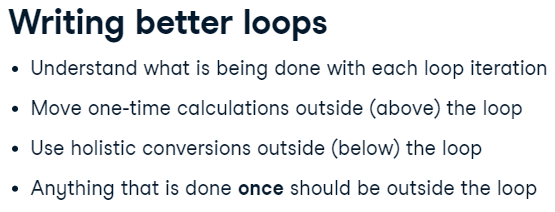

### Moving calculations above a loop

In [ ]:
names = ['Absol', 'Aron', 'Jynx', 'Natu', 'Onix']
attacks = np.array([130, 70, 50, 50, 45])

In [165]:
%%timeit
for pokemon, attack in zip(names, attacks):
    total_attack_avg = attacks.mean()
    if attack > total_attack_avg:
        print(
            "{}'s attack: {} > average: {}!'"
            .format(pokemon, attack, total_attack_avg)
        )

Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Ab

Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Ab

Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Ab

Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Ab

Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Ab

Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Ab

Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Ab

Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Ab

Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Ab

Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


In [166]:
%%timeit
# Calculate total average onece (outside the loop)
total_attack_avg = attacks.mean()
for pokemon, attack in zip(names, attacks):
    if attack > total_attack_avg:
        print(
            "{}'s attack: {} > average: {}!'"
            .format(pokemon, attack, total_attack_avg)
        )

Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'


Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Ab

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Ab

Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Absol's attack: 130 > average: 69.0!'
Aron's attack: 70 > average: 69.0!'
Ab

### One-time calculation loop
A list of integers that represents each Pokemon's generation. You'd like to gather the counts of each generation and determine what percentage each generation accounts for out of the total count of integers.

In [167]:
gemerations = [4, 1, 3, 5, 1, 3, 2, 1, 5, 3, 6, 4, 5, 2, 3, 1, 1, 4, 5, 5, 2, 3, 6, 3, 1, 5, 6, 6, 5, 4, 2, 3, 3, 3, 3, 6, 3, 5, 4, 2, 5, 3, 1, 5, 3, 2, 1, 6, 4, 4, 6, 5, 1, 3, 2, 5, 5, 4, 5, 6, 5, 3, 4, 4, 4, 4, 1, 4, 6, 4, 1, 3, 3, 3, 6, 4, 5, 3, 3, 3, 1, 2, 5, 1, 1, 1, 1, 4, 4, 4, 6, 6, 2, 4, 3, 2, 4, 5, 3, 6, 6, 3, 1, 1, 2, 1, 5, 5, 4, 3, 5, 3, 2, 5, 3, 4, 3, 4, 4, 2, 2, 5, 5, 5, 1, 2, 4, 5, 5, 5, 6, 5, 5, 3, 2, 6, 1, 5, 4, 6, 6, 1, 1, 1, 1, 2, 6, 6, 1, 1, 4, 1, 4, 4, 5, 1, 5, 5, 1, 2, 5, 5, 3, 4, 3, 3, 5, 5, 5, 1, 1, 1, 4, 3, 1, 2, 5, 5, 5, 4, 2, 5, 2, 6, 5, 1, 1, 3, 1, 1, 3, 6, 2, 5, 5, 4, 2, 6, 1, 6, 6, 4, 6, 6, 3, 5, 2, 5, 5, 6, 6, 4, 6, 2, 4, 4, 5, 5, 4, 3, 1, 4, 5, 1, 1, 4, 5, 2, 4, 3, 4, 2, 4, 1, 6, 1, 1, 1, 1, 5, 5, 6, 6, 3, 5, 5, 5, 2, 1, 6, 1, 4, 3, 3, 3, 1, 3, 3, 5, 1, 4, 3, 1, 6, 5, 5, 4, 6, 6, 2, 5, 4, 4, 1, 1, 2, 2, 4, 6, 2, 2, 1, 2, 2, 3, 5, 1, 2, 3, 4, 6, 1, 5, 1, 3, 1, 5, 2, 1, 1, 1, 1, 1, 1, 5, 3, 2, 1, 3, 5, 6, 5, 5, 1, 1, 4, 4, 5, 5, 3, 3, 5, 5, 5, 3, 5, 2, 1, 5, 2, 3, 3, 4, 5, 2, 2, 4, 1, 5, 3, 5, 5, 3, 6, 5, 3, 4, 3, 3, 4, 3, 2, 4, 3, 3, 4, 4, 1, 1, 1, 2, 2, 1, 1, 4, 1, 1, 4, 3, 6, 4, 4, 5, 3, 1, 2, 4, 5, 2, 2, 1, 3, 3, 3, 3, 3, 6, 6, 1, 4, 3, 3, 1, 1, 1, 5, 5, 3, 3, 2, 4, 5, 3, 2, 4, 1, 4, 4, 1, 3, 1, 4, 5, 2, 5, 2, 1, 1, 1, 1, 1, 1, 3, 1, 3, 2, 6, 6, 3, 3, 3, 2, 1, 1, 1, 1, 5, 4, 4, 5, 6, 6, 5, 5, 5, 1, 1, 5, 5, 3, 1, 5, 2, 6, 4, 2, 1, 1, 1, 5, 5, 1, 2, 2, 1, 4, 3, 2, 1, 1, 1, 1, 3, 1, 4, 2, 1, 4, 4, 1, 2, 5, 4, 6, 2, 2, 6, 2, 1, 2, 3, 4, 1, 1, 1, 3, 3, 4, 3, 3, 3, 2, 5, 5, 1, 1, 4, 4, 5, 3, 4, 4, 4, 4, 4, 4, 4, 5, 3, 3, 5, 5, 1, 1, 5, 5, 6, 3, 2, 5, 5, 5, 1, 1, 1, 3, 3, 1, 5, 2, 5, 5, 3, 5, 3, 3, 3, 1, 4, 5, 4, 3, 4, 3, 2, 3, 5, 3, 5, 5, 5, 2, 6, 2, 3, 4, 6, 4, 3, 3, 6, 1, 2, 1, 2, 6, 2, 2, 2, 5, 1, 3, 4, 2, 5, 3, 1, 6, 3, 2, 3, 4, 3, 6, 1, 2, 4, 4, 4, 1, 1, 2, 5, 5, 4, 2, 2, 2, 2, 3, 3, 5, 3, 3, 5, 3, 2, 6, 5, 6, 3, 6, 1, 4, 1, 2, 1, 1, 5, 5, 5, 5, 5, 4, 2, 2, 3, 3, 4, 2, 4, 5, 3, 3, 6, 3, 5, 4, 5, 5, 2, 2, 6, 2, 6, 2, 5, 2, 2, 4, 5, 5, 5, 1, 5, 1, 1, 1, 4, 3, 5, 1, 3, 1, 5, 6, 3, 6, 5, 1, 5, 1, 3, 3, 3, 1, 5, 4, 1, 1, 1, 5, 5, 3, 3, 1, 3, 2, 5, 2, 4, 4, 4, 3, 3, 2, 6, 5, 2, 4, 6, 3, 1, 5, 5, 3, 5, 5, 1, 5]

In [ ]:
for gen,count in gen_counts.items():
    total_count = len(generations)
    gen_percent = round(count / total_count * 100, 2)
    print(
      'generation {}: count = {:3} percentage = {}'
      .format(gen, count, gen_percent)
    )

Let's make this loop more efficient by moving a one-time calculation outside the loop.

In [168]:
# # Import Counter
# from collections import Counter

# Collect the count of each generation
gen_counts = Counter(generations)

# Improve for loop by moving one calculation above the loop
total_count = len(generations)

for gen,count in gen_counts.items():
    gen_percent = round(count / total_count * 100, 2)

    print('generation {}: count = {:3} percentage = {}'
          .format(gen, count, gen_percent))

generation 2: count =  69 percentage = 13.8
generation 4: count =  84 percentage = 16.8
generation 3: count = 107 percentage = 21.4
generation 5: count =  95 percentage = 19.0
generation 1: count =  96 percentage = 19.2
generation 6: count =  49 percentage = 9.8


### Holistic conversion loop
A list of names that presents Pokemon's types. You'd like to gather all the possible pairs of Pokémon types. You want to store each of these pairs in an individual list with an enumerated index as the first element of each list. This allows you to see the total number of possible pairs and provides an indexed label for each pair.

In [169]:
pokemon_types = ['Bug', 'Dark', 'Dragon', 'Electric', 'Fairy', 'Fighting', 'Fire', 'Flying', 'Ghost', 'Grass', 'Ground', 'Ice', 'Normal', 'Poison', 'Psychic', 'Rock', 'Steel', 'Water']

In [ ]:
enumerated_pairs = []

for i,pair in enumerate(possible_pairs, 1):
    enumerated_pair_tuple = (i,) + pair
    enumerated_pair_list = list(enumerated_pair_tuple)
    enumerated_pairs.append(enumerated_pair_list)

Let's make this loop more efficient using a holistic conversion.

In [170]:
# Collect all possible pairs using combinations()
possible_pairs = [*combinations(pokemon_types, 2)]

# Create an empty list called enumerated_tuples
enumerated_tuples = []

# Add a line to append each enumerated_pair_tuple to the empty list above
for i,pair in enumerate(possible_pairs, 1):
    enumerated_pair_tuple = (i,) + pair
    enumerated_pair_list = list(enumerated_pair_tuple)
    enumerated_tuples.append(enumerated_pair_list)

# Convert all tuples in enumerated_tuples to a list
enumerated_pairs = [*map(list, enumerated_tuples)]
print(enumerated_pairs)

[[1, 'Bug', 'Dark'], [2, 'Bug', 'Dragon'], [3, 'Bug', 'Electric'], [4, 'Bug', 'Fairy'], [5, 'Bug', 'Fighting'], [6, 'Bug', 'Fire'], [7, 'Bug', 'Flying'], [8, 'Bug', 'Ghost'], [9, 'Bug', 'Grass'], [10, 'Bug', 'Ground'], [11, 'Bug', 'Ice'], [12, 'Bug', 'Normal'], [13, 'Bug', 'Poison'], [14, 'Bug', 'Psychic'], [15, 'Bug', 'Rock'], [16, 'Bug', 'Steel'], [17, 'Bug', 'Water'], [18, 'Dark', 'Dragon'], [19, 'Dark', 'Electric'], [20, 'Dark', 'Fairy'], [21, 'Dark', 'Fighting'], [22, 'Dark', 'Fire'], [23, 'Dark', 'Flying'], [24, 'Dark', 'Ghost'], [25, 'Dark', 'Grass'], [26, 'Dark', 'Ground'], [27, 'Dark', 'Ice'], [28, 'Dark', 'Normal'], [29, 'Dark', 'Poison'], [30, 'Dark', 'Psychic'], [31, 'Dark', 'Rock'], [32, 'Dark', 'Steel'], [33, 'Dark', 'Water'], [34, 'Dragon', 'Electric'], [35, 'Dragon', 'Fairy'], [36, 'Dragon', 'Fighting'], [37, 'Dragon', 'Fire'], [38, 'Dragon', 'Flying'], [39, 'Dragon', 'Ghost'], [40, 'Dragon', 'Grass'], [41, 'Dragon', 'Ground'], [42, 'Dragon', 'Ice'], [43, 'Dragon', 'Nor

### Bringing it all together: Pokémon z-scores
A list of 720 Pokémon has been loaded into your session as names. Each Pokémon's corresponding Health Points is stored in a NumPy array called hps. You want to analyze the Health Points using the z-score to see how many standard deviations each Pokémon's HP is from the mean of all HPs.

In [ ]:
%%timeit
poke_zscores = []

for name,hp in zip(names, hps):
    hp_avg = hps.mean()
    hp_std = hps.std()
    z_score = (hp - hp_avg)/hp_std
    poke_zscores.append((name, hp, z_score))

highest_hp_pokemon = []

for name,hp,zscore in poke_zscores:
    if zscore > 2:
        highest_hp_pokemon.append((name, hp, zscore))

print(*poke_zscores[:3], sep='\n')

In [ ]:
83.1 ms +- 5.52 ms per loop (mean +- std. dev. of 7 runs, 10 loops each)

In [ ]:
# Use NumPy to eliminate the for loop used to create the z-scores.
# Calculate the total HP avg and total HP standard deviation
hp_avg = hps.mean()
hp_std = hps.std()

# Use NumPy to eliminate the previous for loop
z_scores = (hps - hp_avg)/hp_std

# Combine names, hps, and z_scores
poke_zscores2 = [*zip(names, hps, z_scores)]
print(*poke_zscores2[:3], sep='\n')

# Use list comprehension with the same logic as the highest_hp_pokemon code block
highest_hp_pokemon2 = [(names, hps, z_scores) for names,hps,z_scores in poke_zscores2 if z_scores > 2]
print(*highest_hp_pokemon2, sep='\n')

In [ ]:
('Abomasnow', 80.0, 0.46797638117739043)
('Abra', 60.0, -0.3271693284337512)
('Absol', 131.0, 2.4955979406858013)

In [ ]:
('Abomasnow', 80.0, 0.46797638117739043)
('Abra', 60.0, -0.3271693284337512)
('Absol', 131.0, 2.4955979406858013)
('Absol', 131.0, 2.4955979406858013)
('Bonsly', 127.0, 2.3365687987635733)
('Caterpie', 122.0, 2.137782371360788)
('Cofagrigus', 133.0, 2.575112511646916)
('Cresselia', 126.0, 2.296811513283016)
('Dewgong', 122.0, 2.137782371360788)
('Druddigon', 126.0, 2.296811513283016)
('Froakie', 123.0, 2.1775396568413448)
('Kadabra', 135.0, 2.65462708260803)
('Klang', 123.0, 2.1775396568413448)
('Kricketune', 122.0, 2.137782371360788)
('Lumineon', 129.0, 2.4160833697246873)
('Magnemite', 137.0, 2.734141653569144)
('Nidorina', 119.0, 2.0185105149191167)
('Onix', 126.0, 2.296811513283016)
('Prinplup', 124.0, 2.217296942321902)
('Skuntank', 128.0, 2.3763260842441305)
('Swellow', 125.0, 2.2570542278024592)

In [ ]:
#time
282 us +- 13.5 us per loop (mean +- std. dev. of 7 runs, 1000 loops each)

# Basic pandas optimizations
## Intro to pandas DataFrame iteration

In [1]:
import pandas as pd

baseball_df = pd.read_csv('baseball_stats.csv')
print(baseball_df.head())

  Team League  Year   RS   RA   W    OBP    SLG     BA  Playoffs  RankSeason  \
0  ARI     NL  2012  734  688  81  0.328  0.418  0.259         0         NaN   
1  ATL     NL  2012  700  600  94  0.320  0.389  0.247         1         4.0   
2  BAL     AL  2012  712  705  93  0.311  0.417  0.247         1         5.0   
3  BOS     AL  2012  734  806  69  0.315  0.415  0.260         0         NaN   
4  CHC     NL  2012  613  759  61  0.302  0.378  0.240         0         NaN   

   RankPlayoffs    G   OOBP   OSLG  
0           NaN  162  0.317  0.415  
1           5.0  162  0.306  0.378  
2           4.0  162  0.315  0.403  
3           NaN  162  0.331  0.428  
4           NaN  162  0.335  0.424  


In [174]:
# Calculating with percentage
def calc_win_perc(wins, games_played):
    win_perc = wins / games_played
    return np.round(win_perc,2)

In [176]:
win_perc = calc_win_perc(50, 100)
print(win_perc)

0.5


### Iterating with .iloc

In [181]:
# Adding win percentage to DataFrame
win_perc_list = []

for i in range(len(baseball_df)):
    row = baseball_df.iloc[i]
    wins = row['W']
    games_played = row['G']
    win_perc = calc_win_perc(wins, games_played)
    win_perc_list.append(win_perc)
baseball_df['WP'] = win_perc_list
#print(baseball_df.head())

In [ ]:
# time
185 ms ± 21 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)

### Iterating with iterrows()

In [182]:
%%timeit
win_perc_list = []

for i, row in baseball_df.iterrows():
    wins = row['W']
    games_played = row['G']
    win_perc = calc_win_perc(wins, games_played)
    win_perc_list.append(win_perc)
baseball_df['WP'] = win_perc_list

80.9 ms ± 16.3 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


`pit_df` DataFrame contains the stats for the Major League Baseball team named the Pittsburgh Pirates (abbreviated as 'PIT') from the year 2008 to the year 2012. 

In [199]:
pit_df = baseball_df[baseball_df['Team'] == 'PIT'] 
pit_df = pit_df[pit_df['Year'].isin(np.arange(2008, 2013))]
pit_df = pit_df[['Team', 'League', 'Year', 'RS', 'RA', 'W', 'G', 'Playoffs']]

In [200]:
pit_df

,Team,League,Year,RS,RA,W,G,Playoffs
21,PIT,NL,2012,651,674,79,162,0
51,PIT,NL,2011,610,712,72,162,0
81,PIT,NL,2010,587,866,57,162,0
111,PIT,NL,2009,636,768,62,161,0
141,PIT,NL,2008,735,884,67,162,0


In [201]:
# Iterate over pit_df and print each row
for i,row in pit_df.iterrows():
    print(row)

Team         PIT
League        NL
Year        2012
RS           651
RA           674
W             79
G            162
Playoffs       0
Name: 21, dtype: object
Team         PIT
League        NL
Year        2011
RS           610
RA           712
W             72
G            162
Playoffs       0
Name: 51, dtype: object
Team         PIT
League        NL
Year        2010
RS           587
RA           866
W             57
G            162
Playoffs       0
Name: 81, dtype: object
Team         PIT
League        NL
Year        2009
RS           636
RA           768
W             62
G            161
Playoffs       0
Name: 111, dtype: object
Team         PIT
League        NL
Year        2008
RS           735
RA           884
W             67
G            162
Playoffs       0
Name: 141, dtype: object


In [202]:
# Iterate over pit_df and print each index variable and then each row
for i,row in pit_df.iterrows():
    print(i)
    print(row)
    print(type(row))

21
Team         PIT
League        NL
Year        2012
RS           651
RA           674
W             79
G            162
Playoffs       0
Name: 21, dtype: object
<class 'pandas.core.series.Series'>
51
Team         PIT
League        NL
Year        2011
RS           610
RA           712
W             72
G            162
Playoffs       0
Name: 51, dtype: object
<class 'pandas.core.series.Series'>
81
Team         PIT
League        NL
Year        2010
RS           587
RA           866
W             57
G            162
Playoffs       0
Name: 81, dtype: object
<class 'pandas.core.series.Series'>
111
Team         PIT
League        NL
Year        2009
RS           636
RA           768
W             62
G            161
Playoffs       0
Name: 111, dtype: object
<class 'pandas.core.series.Series'>
141
Team         PIT
League        NL
Year        2008
RS           735
RA           884
W             67
G            162
Playoffs       0
Name: 141, dtype: object
<class 'pandas.core.series.Series'>


In [203]:
# Use one variable instead of two to store the result of .iterrows()
for row_tuple in pit_df.iterrows():
    print(row_tuple)

(21, Team         PIT
League        NL
Year        2012
RS           651
RA           674
W             79
G            162
Playoffs       0
Name: 21, dtype: object)
(51, Team         PIT
League        NL
Year        2011
RS           610
RA           712
W             72
G            162
Playoffs       0
Name: 51, dtype: object)
(81, Team         PIT
League        NL
Year        2010
RS           587
RA           866
W             57
G            162
Playoffs       0
Name: 81, dtype: object)
(111, Team         PIT
League        NL
Year        2009
RS           636
RA           768
W             62
G            161
Playoffs       0
Name: 111, dtype: object)
(141, Team         PIT
League        NL
Year        2008
RS           735
RA           884
W             67
G            162
Playoffs       0
Name: 141, dtype: object)


In [204]:
# Print the row and type of each row
for row_tuple in pit_df.iterrows():
    print(row_tuple)
    print(type(row_tuple))

(21, Team         PIT
League        NL
Year        2012
RS           651
RA           674
W             79
G            162
Playoffs       0
Name: 21, dtype: object)
<class 'tuple'>
(51, Team         PIT
League        NL
Year        2011
RS           610
RA           712
W             72
G            162
Playoffs       0
Name: 51, dtype: object)
<class 'tuple'>
(81, Team         PIT
League        NL
Year        2010
RS           587
RA           866
W             57
G            162
Playoffs       0
Name: 81, dtype: object)
<class 'tuple'>
(111, Team         PIT
League        NL
Year        2009
RS           636
RA           768
W             62
G            161
Playoffs       0
Name: 111, dtype: object)
<class 'tuple'>
(141, Team         PIT
League        NL
Year        2008
RS           735
RA           884
W             67
G            162
Playoffs       0
Name: 141, dtype: object)
<class 'tuple'>


`.iterrows()` returns each DataFrame row as a tuple of (index, pandas Series) pairs, you can either split this tuple and use the index and row-values separately (as you did with `for i,row in pit_df.iterrows()`), or you can keep the result of `.iterrows()` in the tuple form (as you did with `for row_tuple in pit_df.iterrows()`).

If using `i,row`, you can access things from the row using square brackets (i.e., `row['Team']`). If using `row_tuple`, you would have to specify which element of the tuple you'd like to access before grabbing the team name (i.e., `row_tuple[1]['Team']`).

With either approach, using .iterrows() will still be substantially faster than using .iloc

### Run differentials with .iterrows()
calculate a metric called the run differential for he San Francisco Giants as an analyst for each season from the year 2008 to 2012. This metric is calculated by subtracting the total number of runs a team allowed in a season from the team's total number of runs scored in a season. 'RS' means runs scored and 'RA' means runs allowed.

In [205]:
giants_df = baseball_df[baseball_df['Team'] == 'SFG'] 
giants_df = giants_df[giants_df['Year'].isin(np.arange(2008, 2013))]
giants_df = giants_df[['Team', 'League', 'Year', 'RS', 'RA', 'W', 'G', 'Playoffs']]

In [206]:
giants_df

,Team,League,Year,RS,RA,W,G,Playoffs
24,SFG,NL,2012,718,649,94,162,1
54,SFG,NL,2011,570,578,86,162,0
84,SFG,NL,2010,697,583,92,162,1
114,SFG,NL,2009,657,611,88,162,0
144,SFG,NL,2008,640,759,72,162,0


In [4]:
def calc_run_diff(runs_scored, runs_allowed):

    run_diff = runs_scored - runs_allowed

    return run_diff

In [208]:
# Create an empty list to store run differentials
run_diffs = []

# Write a for loop and collect runs allowed and runs scored for each row
for i,row in giants_df.iterrows():
    runs_scored = row['RS']
    runs_allowed = row['RA']
    
    # Use the provided function to calculate run_diff for each row
    run_diff = calc_run_diff(runs_scored, runs_allowed)
    
    # Append each run differential to the output list
    run_diffs.append(run_diff)

giants_df['RD'] = run_diffs
print(giants_df)

    Team League  Year   RS   RA   W    G  Playoffs   RD
24   SFG     NL  2012  718  649  94  162         1   69
54   SFG     NL  2011  570  578  86  162         0   -8
84   SFG     NL  2010  697  583  92  162         1  114
114  SFG     NL  2009  657  611  88  162         0   46
144  SFG     NL  2008  640  759  72  162         0 -119


## Another iterator method: .itertuples()

In [209]:
team_wins_df = baseball_df[['Team', 'Year', 'W']]
print(team_wins_df)

     Team  Year    W
0     ARI  2012   81
1     ATL  2012   94
2     BAL  2012   93
3     BOS  2012   69
4     CHC  2012   61
...   ...   ...  ...
1227  PHI  1962   81
1228  PIT  1962   93
1229  SFG  1962  103
1230  STL  1962   84
1231  WSA  1962   60

[1232 rows x 3 columns]


In [210]:
# .iterrows()
for row_tuple in team_wins_df.iterrows():
    print(row_tuple)
    print(type(row_tuple[1]))

(0, Team     ARI
Year    2012
W         81
Name: 0, dtype: object)
<class 'pandas.core.series.Series'>
(1, Team     ATL
Year    2012
W         94
Name: 1, dtype: object)
<class 'pandas.core.series.Series'>
(2, Team     BAL
Year    2012
W         93
Name: 2, dtype: object)
<class 'pandas.core.series.Series'>
(3, Team     BOS
Year    2012
W         69
Name: 3, dtype: object)
<class 'pandas.core.series.Series'>
(4, Team     CHC
Year    2012
W         61
Name: 4, dtype: object)
<class 'pandas.core.series.Series'>
(5, Team     CHW
Year    2012
W         85
Name: 5, dtype: object)
<class 'pandas.core.series.Series'>
(6, Team     CIN
Year    2012
W         97
Name: 6, dtype: object)
<class 'pandas.core.series.Series'>
(7, Team     CLE
Year    2012
W         68
Name: 7, dtype: object)
<class 'pandas.core.series.Series'>
(8, Team     COL
Year    2012
W         64
Name: 8, dtype: object)
<class 'pandas.core.series.Series'>
(9, Team     DET
Year    2012
W         88
Name: 9, dtype: object)
<class

(355, Team     SFG
Year    2001
W         90
Name: 355, dtype: object)
<class 'pandas.core.series.Series'>
(356, Team     STL
Year    2001
W         93
Name: 356, dtype: object)
<class 'pandas.core.series.Series'>
(357, Team     TBD
Year    2001
W         62
Name: 357, dtype: object)
<class 'pandas.core.series.Series'>
(358, Team     TEX
Year    2001
W         73
Name: 358, dtype: object)
<class 'pandas.core.series.Series'>
(359, Team     TOR
Year    2001
W         80
Name: 359, dtype: object)
<class 'pandas.core.series.Series'>
(360, Team     ANA
Year    2000
W         82
Name: 360, dtype: object)
<class 'pandas.core.series.Series'>
(361, Team     ARI
Year    2000
W         85
Name: 361, dtype: object)
<class 'pandas.core.series.Series'>
(362, Team     ATL
Year    2000
W         95
Name: 362, dtype: object)
<class 'pandas.core.series.Series'>
(363, Team     BAL
Year    2000
W         74
Name: 363, dtype: object)
<class 'pandas.core.series.Series'>
(364, Team     BOS
Year    2000
W    

(599, Team     MIN
Year    1990
W         74
Name: 599, dtype: object)
<class 'pandas.core.series.Series'>
(600, Team     MON
Year    1990
W         85
Name: 600, dtype: object)
<class 'pandas.core.series.Series'>
(601, Team     NYM
Year    1990
W         91
Name: 601, dtype: object)
<class 'pandas.core.series.Series'>
(602, Team     NYY
Year    1990
W         67
Name: 602, dtype: object)
<class 'pandas.core.series.Series'>
(603, Team     OAK
Year    1990
W        103
Name: 603, dtype: object)
<class 'pandas.core.series.Series'>
(604, Team     PHI
Year    1990
W         77
Name: 604, dtype: object)
<class 'pandas.core.series.Series'>
(605, Team     PIT
Year    1990
W         95
Name: 605, dtype: object)
<class 'pandas.core.series.Series'>
(606, Team     SDP
Year    1990
W         75
Name: 606, dtype: object)
<class 'pandas.core.series.Series'>
(607, Team     SEA
Year    1990
W         77
Name: 607, dtype: object)
<class 'pandas.core.series.Series'>
(608, Team     SFG
Year    1990
W    

(778, Team     KCR
Year    1983
W         79
Name: 778, dtype: object)
<class 'pandas.core.series.Series'>
(779, Team     LAD
Year    1983
W         91
Name: 779, dtype: object)
<class 'pandas.core.series.Series'>
(780, Team     MIL
Year    1983
W         87
Name: 780, dtype: object)
<class 'pandas.core.series.Series'>
(781, Team     MIN
Year    1983
W         70
Name: 781, dtype: object)
<class 'pandas.core.series.Series'>
(782, Team     MON
Year    1983
W         82
Name: 782, dtype: object)
<class 'pandas.core.series.Series'>
(783, Team     NYM
Year    1983
W         68
Name: 783, dtype: object)
<class 'pandas.core.series.Series'>
(784, Team     NYY
Year    1983
W         91
Name: 784, dtype: object)
<class 'pandas.core.series.Series'>
(785, Team     OAK
Year    1983
W         74
Name: 785, dtype: object)
<class 'pandas.core.series.Series'>
(786, Team     PHI
Year    1983
W         90
Name: 786, dtype: object)
<class 'pandas.core.series.Series'>
(787, Team     PIT
Year    1983
W    

(1191, Team     WSA
Year    1964
W         62
Name: 1191, dtype: object)
<class 'pandas.core.series.Series'>
(1192, Team     BAL
Year    1963
W         86
Name: 1192, dtype: object)
<class 'pandas.core.series.Series'>
(1193, Team     BOS
Year    1963
W         76
Name: 1193, dtype: object)
<class 'pandas.core.series.Series'>
(1194, Team     CHC
Year    1963
W         82
Name: 1194, dtype: object)
<class 'pandas.core.series.Series'>
(1195, Team     CHW
Year    1963
W         94
Name: 1195, dtype: object)
<class 'pandas.core.series.Series'>
(1196, Team     CIN
Year    1963
W         86
Name: 1196, dtype: object)
<class 'pandas.core.series.Series'>
(1197, Team     CLE
Year    1963
W         79
Name: 1197, dtype: object)
<class 'pandas.core.series.Series'>
(1198, Team     DET
Year    1963
W         79
Name: 1198, dtype: object)
<class 'pandas.core.series.Series'>
(1199, Team     HOU
Year    1963
W         66
Name: 1199, dtype: object)
<class 'pandas.core.series.Series'>
(1200, Team     KCA

In [211]:
# Iterating with .itertuples()
for row_namedtuple in team_wins_df.itertuples():
    print(row_namedtuple)

Pandas(Index=0, Team='ARI', Year=2012, W=81)
Pandas(Index=1, Team='ATL', Year=2012, W=94)
Pandas(Index=2, Team='BAL', Year=2012, W=93)
Pandas(Index=3, Team='BOS', Year=2012, W=69)
Pandas(Index=4, Team='CHC', Year=2012, W=61)
Pandas(Index=5, Team='CHW', Year=2012, W=85)
Pandas(Index=6, Team='CIN', Year=2012, W=97)
Pandas(Index=7, Team='CLE', Year=2012, W=68)
Pandas(Index=8, Team='COL', Year=2012, W=64)
Pandas(Index=9, Team='DET', Year=2012, W=88)
Pandas(Index=10, Team='HOU', Year=2012, W=55)
Pandas(Index=11, Team='KCR', Year=2012, W=72)
Pandas(Index=12, Team='LAA', Year=2012, W=89)
Pandas(Index=13, Team='LAD', Year=2012, W=86)
Pandas(Index=14, Team='MIA', Year=2012, W=69)
Pandas(Index=15, Team='MIL', Year=2012, W=83)
Pandas(Index=16, Team='MIN', Year=2012, W=66)
Pandas(Index=17, Team='NYM', Year=2012, W=74)
Pandas(Index=18, Team='NYY', Year=2012, W=95)
Pandas(Index=19, Team='OAK', Year=2012, W=94)
Pandas(Index=20, Team='PHI', Year=2012, W=81)
Pandas(Index=21, Team='PIT', Year=2012, W=79

The dot-itertuples method returns each DataFrame row as a special data type called a namedtuple. A namedtuple is one of the specialized data types that exist within the collections module.

In [212]:
print(row_namedtuple.Index)

1231


In [213]:
print(row_namedtuple.Team)

WSA


### Comparing methods
efficient
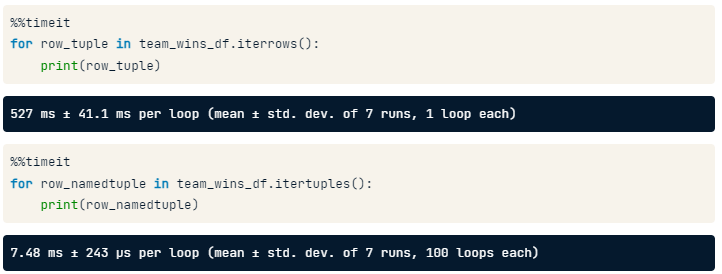

When using `dot-iterrows`, we can use `square brackets` to reference a column within our team_wins_df DataFrame. <br>
When looking up an attribute within a `namedtuple`, we must use a `dot` to reference the attribute.
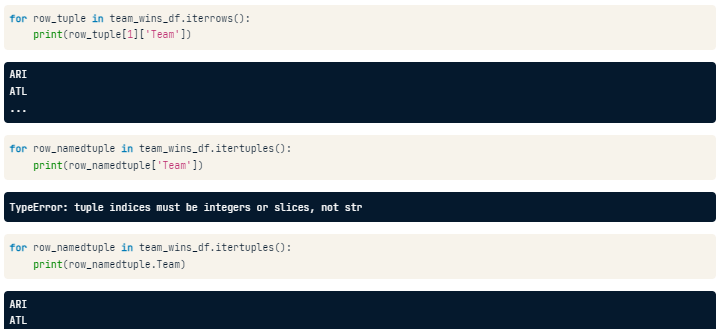

## pandas alternative to looping
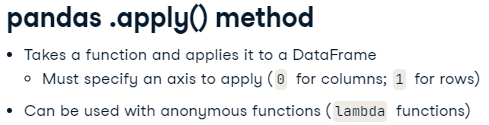

In [5]:
run_diffs_apply = baseball_df.apply(
         lambda row: calc_run_diff(row['RS'], row['RA']),
         axis=1)
baseball_df['RD'] = run_diffs_apply
print(baseball_df)

     Team League  Year   RS   RA    W    OBP    SLG     BA  Playoffs  \
0     ARI     NL  2012  734  688   81  0.328  0.418  0.259         0   
1     ATL     NL  2012  700  600   94  0.320  0.389  0.247         1   
2     BAL     AL  2012  712  705   93  0.311  0.417  0.247         1   
3     BOS     AL  2012  734  806   69  0.315  0.415  0.260         0   
4     CHC     NL  2012  613  759   61  0.302  0.378  0.240         0   
...   ...    ...   ...  ...  ...  ...    ...    ...    ...       ...   
1227  PHI     NL  1962  705  759   81  0.330  0.390  0.260         0   
1228  PIT     NL  1962  706  626   93  0.321  0.394  0.268         0   
1229  SFG     NL  1962  878  690  103  0.341  0.441  0.278         1   
1230  STL     NL  1962  774  664   84  0.335  0.394  0.271         0   
1231  WSA     AL  1962  599  716   60  0.308  0.373  0.250         0   

      RankSeason  RankPlayoffs    G   OOBP   OSLG   RD  
0            NaN           NaN  162  0.317  0.415   46  
1            4.0     

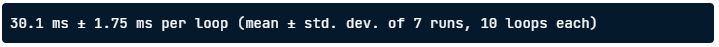

### Analyzing baseball stats with .apply()
The Tampa Bay Rays want you to analyze their data.

They'd like the following metrics:

* The sum of each column in the data
* The total amount of runs scored in a year ('RS' + 'RA' for each year)
* The 'Playoffs' column in text format rather than using 1's and 0's

In [11]:
rays_df = baseball_df[baseball_df['Team'] == 'TBR'] 
rays_df = rays_df[rays_df['Year'].isin(np.arange(2008, 2013))]
rays_df = rays_df[['Year', 'RS', 'RA', 'W', 'Playoffs']]
# Year is the index
rays_df.set_index(['Year'], inplace = True)

In [12]:
print(rays_df)

       RS   RA   W  Playoffs
Year                        
2012  697  577  90         0
2011  707  614  91         1
2010  802  649  96         1
2009  803  754  84         0
2008  774  671  97         1


In [16]:
def text_playoffs(num_playoffs): 
    if num_playoffs == 1:
        return 'Yes'
    else:
        return 'No' 

In [13]:
# Gather sum of all columns
stat_totals = rays_df.apply(sum, axis=0)
print(stat_totals)

RS          3783
RA          3265
W            458
Playoffs       3
dtype: int64


In [14]:
# Gather total runs scored in all games per year
total_runs_scored = rays_df[['RS', 'RA']].apply(sum, axis=1)
print(total_runs_scored)

Year
2012    1274
2011    1321
2010    1451
2009    1557
2008    1445
dtype: int64


In [17]:
# Convert numeric playoffs to text by applying text_playoffs()
textual_playoffs = rays_df.apply(lambda row: text_playoffs(row['Playoffs']), axis=1)
print(textual_playoffs)

Year
2012     No
2011    Yes
2010    Yes
2009     No
2008    Yes
dtype: object


### Settle a debate with .apply()
One manager claims that the team has made the playoffs every year they have had a win percentage of 0.50 or greater. Another manager says this is not true.

In [18]:
dbacks_df = baseball_df[baseball_df['Team'] == 'ARI'] 
dbacks_df = dbacks_df[dbacks_df['Year'].isin(np.arange(1998, 2013))]
dbacks_df = dbacks_df[['Team', 'League', 'Year', 'RS', 'RA', 'W', 'G', 'Playoffs']]

In [20]:
def calc_win_perc(wins, games_played):
    win_perc = wins / games_played
    return np.round(win_perc,2)

In [19]:
# Display the first five rows of the DataFrame
print(dbacks_df.head())

    Team League  Year   RS   RA   W    G  Playoffs
0    ARI     NL  2012  734  688  81  162         0
30   ARI     NL  2011  731  662  94  162         1
60   ARI     NL  2010  713  836  65  162         0
90   ARI     NL  2009  720  782  70  162         0
120  ARI     NL  2008  720  706  82  162         0


In [24]:
# Create a win percentage Series 
win_percs = dbacks_df.apply(lambda row: calc_win_perc(row['W'], row['G']), axis=1)
print(win_percs, '\n')

0      0.50
30     0.58
60     0.40
90     0.43
120    0.51
150    0.56
180    0.47
210    0.48
241    0.31
271    0.52
301    0.60
331    0.57
361    0.52
391    0.62
421    0.40
dtype: float64 



In [25]:
# Append a new column to dbacks_df
dbacks_df['WP'] = win_percs
print(dbacks_df, '\n')

    Team League  Year   RS   RA    W    G  Playoffs    WP
0    ARI     NL  2012  734  688   81  162         0  0.50
30   ARI     NL  2011  731  662   94  162         1  0.58
60   ARI     NL  2010  713  836   65  162         0  0.40
90   ARI     NL  2009  720  782   70  162         0  0.43
120  ARI     NL  2008  720  706   82  162         0  0.51
150  ARI     NL  2007  712  732   90  162         1  0.56
180  ARI     NL  2006  773  788   76  162         0  0.47
210  ARI     NL  2005  696  856   77  162         0  0.48
241  ARI     NL  2004  615  899   51  162         0  0.31
271  ARI     NL  2003  717  685   84  162         0  0.52
301  ARI     NL  2002  819  674   98  162         1  0.60
331  ARI     NL  2001  818  677   92  162         1  0.57
361  ARI     NL  2000  792  754   85  162         0  0.52
391  ARI     NL  1999  908  676  100  162         1  0.62
421  ARI     NL  1998  665  812   65  162         0  0.40 



In [26]:
# Display dbacks_df where WP is greater than 0.50
print(dbacks_df[dbacks_df['WP'] >= 0.50])

    Team League  Year   RS   RA    W    G  Playoffs    WP
0    ARI     NL  2012  734  688   81  162         0  0.50
30   ARI     NL  2011  731  662   94  162         1  0.58
120  ARI     NL  2008  720  706   82  162         0  0.51
150  ARI     NL  2007  712  732   90  162         1  0.56
271  ARI     NL  2003  717  685   84  162         0  0.52
301  ARI     NL  2002  819  674   98  162         1  0.60
331  ARI     NL  2001  818  677   92  162         1  0.57
361  ARI     NL  2000  792  754   85  162         0  0.52
391  ARI     NL  1999  908  676  100  162         1  0.62


so, The manager who claimed the team has not made the playoffs every year they've had a win percentage of 0.50 or greater.

## Optimal pandas iterating

In [2]:
print(baseball_df)

     Team League  Year   RS   RA    W    OBP    SLG     BA  Playoffs  \
0     ARI     NL  2012  734  688   81  0.328  0.418  0.259         0   
1     ATL     NL  2012  700  600   94  0.320  0.389  0.247         1   
2     BAL     AL  2012  712  705   93  0.311  0.417  0.247         1   
3     BOS     AL  2012  734  806   69  0.315  0.415  0.260         0   
4     CHC     NL  2012  613  759   61  0.302  0.378  0.240         0   
...   ...    ...   ...  ...  ...  ...    ...    ...    ...       ...   
1227  PHI     NL  1962  705  759   81  0.330  0.390  0.260         0   
1228  PIT     NL  1962  706  626   93  0.321  0.394  0.268         0   
1229  SFG     NL  1962  878  690  103  0.341  0.441  0.278         1   
1230  STL     NL  1962  774  664   84  0.335  0.394  0.271         0   
1231  WSA     AL  1962  599  716   60  0.308  0.373  0.250         0   

      RankSeason  RankPlayoffs    G   OOBP   OSLG  
0            NaN           NaN  162  0.317  0.415  
1            4.0           5.0 

In [3]:
wins_np = baseball_df['W'].values
print(type(wins_np))

<class 'numpy.ndarray'>


In [4]:
print(wins_np)

[ 81  94  93 ... 103  84  60]


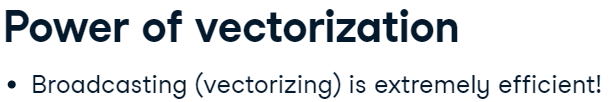

In [6]:
run_diffs_np = baseball_df['RS'].values - baseball_df['RA'].values
baseball_df['RD'] = run_diffs_np
print(baseball_df)

     Team League  Year   RS   RA    W    OBP    SLG     BA  Playoffs  \
0     ARI     NL  2012  734  688   81  0.328  0.418  0.259         0   
1     ATL     NL  2012  700  600   94  0.320  0.389  0.247         1   
2     BAL     AL  2012  712  705   93  0.311  0.417  0.247         1   
3     BOS     AL  2012  734  806   69  0.315  0.415  0.260         0   
4     CHC     NL  2012  613  759   61  0.302  0.378  0.240         0   
...   ...    ...   ...  ...  ...  ...    ...    ...    ...       ...   
1227  PHI     NL  1962  705  759   81  0.330  0.390  0.260         0   
1228  PIT     NL  1962  706  626   93  0.321  0.394  0.268         0   
1229  SFG     NL  1962  878  690  103  0.341  0.441  0.278         1   
1230  STL     NL  1962  774  664   84  0.335  0.394  0.271         0   
1231  WSA     AL  1962  599  716   60  0.308  0.373  0.250         0   

      RankSeason  RankPlayoffs    G   OOBP   OSLG   RD  
0            NaN           NaN  162  0.317  0.415   46  
1            4.0     

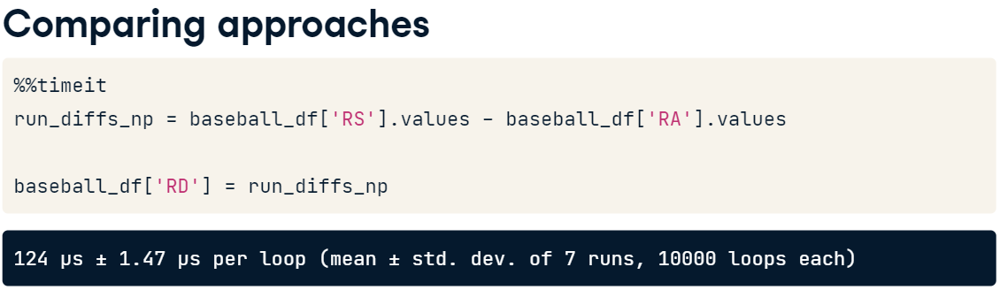
the array approach is orders of magnitude faster than all previous approaches!

### Replacing .iloc with underlying arrays
You'll revisit the win percentage calculations you performed row by row with the .iloc method:

In [9]:
def calc_win_perc(wins, games_played):
    win_perc = wins / games_played
    return np.round(win_perc,2)

win_percs_list = []

for i in range(len(baseball_df)):
    row = baseball_df.iloc[i]

    wins = row['W']
    games_played = row['G']

    win_perc = calc_win_perc(wins, games_played)

    win_percs_list.append(win_perc)

baseball_df['WP'] = win_percs_list

In [10]:
# Use the W array and G array to calculate win percentages
win_percs_np = calc_win_perc(baseball_df['W'].values, baseball_df['G'].values)

# Append a new column to baseball_df that stores all win percentages
baseball_df['WP'] = win_percs_np

print(baseball_df.head())

  Team League  Year   RS   RA   W    OBP    SLG     BA  Playoffs  RankSeason  \
0  ARI     NL  2012  734  688  81  0.328  0.418  0.259         0         NaN   
1  ATL     NL  2012  700  600  94  0.320  0.389  0.247         1         4.0   
2  BAL     AL  2012  712  705  93  0.311  0.417  0.247         1         5.0   
3  BOS     AL  2012  734  806  69  0.315  0.415  0.260         0         NaN   
4  CHC     NL  2012  613  759  61  0.302  0.378  0.240         0         NaN   

   RankPlayoffs    G   OOBP   OSLG   RD    WP  
0           NaN  162  0.317  0.415   46  0.50  
1           5.0  162  0.306  0.378  100  0.58  
2           4.0  162  0.315  0.403    7  0.57  
3           NaN  162  0.331  0.428  -72  0.43  
4           NaN  162  0.335  0.424 -146  0.38  


In [12]:
%%timeit
win_percs_list = []

for i in range(len(baseball_df)):
    row = baseball_df.iloc[i]

    wins = row['W']
    games_played = row['G']

    win_perc = calc_win_perc(wins, games_played)

    win_percs_list.append(win_perc)

baseball_df['WP'] = win_percs_list

176 ms ± 19.1 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [14]:
%%timeit
# Use the W array and G array to calculate win percentages
win_percs_np = calc_win_perc(baseball_df['W'].values, baseball_df['G'].values)

# Append a new column to baseball_df that stores all win percentages
baseball_df['WP'] = win_percs_np

184 µs ± 28.2 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


**The NumPy array approach is faster than the .iloc approach.**

### Bringing it all together: Predict win percentage
You'd like to attempt to predict a team's win percentage for a given season by using the team's total runs scored in a season ('RS') and total runs allowed in a season ('RA') with the following function:

In [11]:
def predict_win_perc(RS, RA):
    prediction = RS ** 2 / (RS ** 2 + RA ** 2)
    return np.round(prediction, 2)

In [15]:
win_perc_preds_loop = []

# Use a loop and .itertuples() to collect each row's predicted win percentage
for row in baseball_df.itertuples():
    runs_scored = row.RS
    runs_allowed = row.RA
    win_perc_pred = predict_win_perc(runs_scored, runs_allowed)
    win_perc_preds_loop.append(win_perc_pred)

# Apply predict_win_perc to each row of the DataFrame
win_perc_preds_apply = baseball_df.apply(lambda row: predict_win_perc(row['RS'], row['RA']), axis=1)

# Calculate the win percentage predictions using NumPy arrays
win_perc_preds_np = predict_win_perc(baseball_df['RS'].values, baseball_df['RA'].values)
baseball_df['WP_preds'] = win_perc_preds_np
print(baseball_df.head())

  Team League  Year   RS   RA   W    OBP    SLG     BA  Playoffs  RankSeason  \
0  ARI     NL  2012  734  688  81  0.328  0.418  0.259         0         NaN   
1  ATL     NL  2012  700  600  94  0.320  0.389  0.247         1         4.0   
2  BAL     AL  2012  712  705  93  0.311  0.417  0.247         1         5.0   
3  BOS     AL  2012  734  806  69  0.315  0.415  0.260         0         NaN   
4  CHC     NL  2012  613  759  61  0.302  0.378  0.240         0         NaN   

   RankPlayoffs    G   OOBP   OSLG   RD    WP  WP_preds  
0           NaN  162  0.317  0.415   46  0.50      0.53  
1           5.0  162  0.306  0.378  100  0.58      0.58  
2           4.0  162  0.315  0.403    7  0.57      0.50  
3           NaN  162  0.331  0.428  -72  0.43      0.45  
4           NaN  162  0.335  0.424 -146  0.38      0.39  


In [16]:
%%timeit
win_perc_preds_loop = []

# Use a loop and .itertuples() to collect each row's predicted win percentage
for row in baseball_df.itertuples():
    runs_scored = row.RS
    runs_allowed = row.RA
    win_perc_pred = predict_win_perc(runs_scored, runs_allowed)
    win_perc_preds_loop.append(win_perc_pred)

17.9 ms ± 730 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [18]:
%%timeit
# Apply predict_win_perc to each row of the DataFrame
win_perc_preds_apply = baseball_df.apply(lambda row: predict_win_perc(row['RS'], row['RA']), axis=1)

35.4 ms ± 2.28 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [19]:
%%timeit
# Calculate the win percentage predictions using NumPy arrays
win_perc_preds_np = predict_win_perc(baseball_df['RS'].values, baseball_df['RA'].values)
baseball_df['WP_preds'] = win_perc_preds_np

191 µs ± 13.9 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


***Using NumPy arrays was the fastest approach, followed by the .itertuples() approach, and the .apply() approach was slowest.***